# Univariate Time Series With Stacked LSTM, BiLSTM, and NeuralProphet

This notebook is V.2 with NeuralProphet added!
---

with V.2 some changes made as well.

* [This notebook is generated for the article: Univariate Time Series With Stacked LSTM, BiLSTM, and NeuralProphet.](https://pub.towardsai.net/univariate-time-series-with-stacked-lstm-bilstm-and-neuralprophet-c8d6a11a9665)

# Import libraries

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import sklearn.metrics as metrics
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


# Load stock data & preprosses

In [3]:
data = pd.read_csv("/content/drive/MyDrive/Date/AAPL.csv")
print(data.head())


         Date      Open      High       Low     Close  Adj Close     Volume
0  2010-01-04  7.622500  7.660714  7.585000  7.643214   6.562589  493729600
1  2010-01-05  7.664286  7.699643  7.616071  7.656429   6.573936  601904800
2  2010-01-06  7.656429  7.686786  7.526786  7.534643   6.469368  552160000
3  2010-01-07  7.562500  7.571429  7.466071  7.520714   6.457407  477131200
4  2010-01-08  7.510714  7.571429  7.466429  7.570714   6.500340  447610800


In [4]:
df = pd.read_csv('/content/drive/MyDrive/Date/AAPL.csv')
df.shape
df

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-01-04,7.622500,7.660714,7.585000,7.643214,6.562589,493729600
1,2010-01-05,7.664286,7.699643,7.616071,7.656429,6.573936,601904800
2,2010-01-06,7.656429,7.686786,7.526786,7.534643,6.469368,552160000
3,2010-01-07,7.562500,7.571429,7.466071,7.520714,6.457407,477131200
4,2010-01-08,7.510714,7.571429,7.466429,7.570714,6.500340,447610800
...,...,...,...,...,...,...,...
2975,2021-10-27,149.360001,149.729996,148.490005,148.850006,148.850006,56094900
2976,2021-10-28,149.820007,153.169998,149.720001,152.570007,152.570007,100077900
2977,2021-10-29,147.220001,149.940002,146.410004,149.800003,149.800003,124850400
2978,2021-11-01,148.990005,149.699997,147.800003,148.960007,148.960007,74445600


In [5]:
df.duplicated().sum().any()

False

In [6]:
sum(df.duplicated())

0

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2980 entries, 0 to 2979
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2980 non-null   object 
 1   Open       2980 non-null   float64
 2   High       2980 non-null   float64
 3   Low        2980 non-null   float64
 4   Close      2980 non-null   float64
 5   Adj Close  2980 non-null   float64
 6   Volume     2980 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 163.1+ KB


preprossesing

In [8]:
def resumetable(df):
    print(f"Dataset Shape: {df.shape}")
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values
    summary['Uniques'] = df.nunique().values
    return summary


resumetable(df)

Dataset Shape: (2980, 7)


,Name,dtypes,Missing,Uniques
0,Date,object,0,2980
1,Open,float64,0,2856
2,High,float64,0,2837
3,Low,float64,0,2853
4,Close,float64,0,2862
5,Adj Close,float64,0,2939
6,Volume,int64,0,2973


In [9]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,2980.000000,2980.000000,2980.000000,2980.000000,2980.000000,2.980000e+03
mean,41.024595,41.444840,40.602074,41.040715,39.343258,2.726309e+08
std,35.489778,35.893334,35.079680,35.506802,36.036754,2.265477e+08
min,6.870357,7.000000,6.794643,6.858929,5.889190,4.544800e+07
25%,18.336607,18.557768,18.146339,18.391518,16.060280,1.106592e+08
50%,28.048750,28.316250,27.805000,28.084999,25.920846,1.869154e+08
75%,47.373126,47.687499,46.905000,47.306875,45.945325,3.734612e+08
max,156.979996,157.259995,154.389999,156.690002,156.690002,1.880998e+09


In [10]:
df.isna().sum()

,0
Date,0
Open,0
High,0
Low,0
Close,0
Adj Close,0
Volume,0


In [13]:
# Convert any date columns to numeric (optional)
for col in df.select_dtypes(include=['datetime64']).columns:
    df[col] = pd.to_datetime(df[col]).astype(int) / 10**9  # Convert to Unix timestamp

# Select only numeric columns
df_numeric = df.select_dtypes(include='number')

# Now print the correlation matrix
print(df_numeric.corr())

               Open      High       Low     Close  Adj Close    Volume
Open       1.000000  0.999897  0.999853  0.999753   0.999648 -0.483814
High       0.999897  1.000000  0.999818  0.999871   0.999774 -0.482251
Low        0.999853  0.999818  1.000000  0.999874   0.999770 -0.486630
Close      0.999753  0.999871  0.999874  1.000000   0.999898 -0.484570
Adj Close  0.999648  0.999774  0.999770  0.999898   1.000000 -0.483597
Volume    -0.483814 -0.482251 -0.486630 -0.484570  -0.483597  1.000000


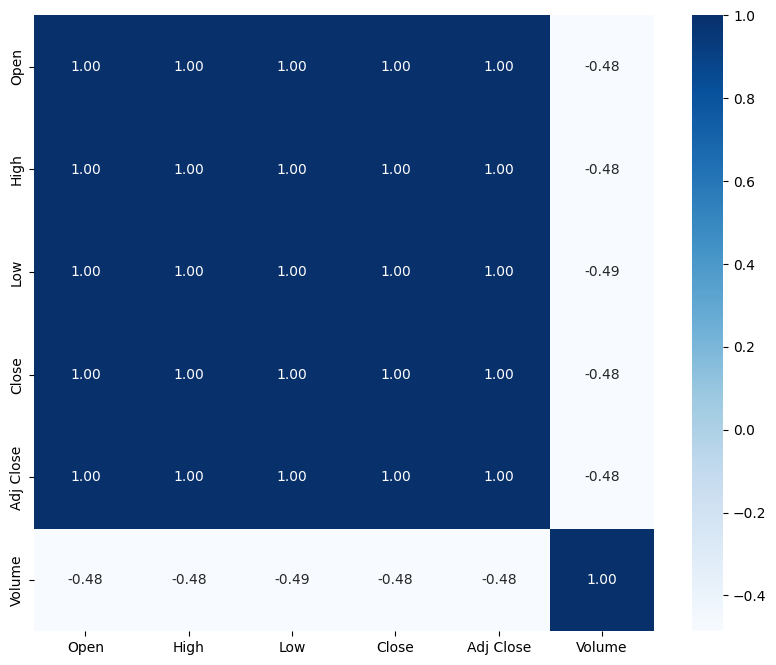

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert any date columns to numeric (optional)
for col in df.select_dtypes(include=['datetime64']).columns:
    df[col] = pd.to_datetime(df[col]).astype(int) / 10**9  # Convert to Unix timestamp

# Select only numeric columns
df_numeric = df.select_dtypes(include='number')

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(df_numeric.corr(), cmap='Blues', annot=True, fmt='.2f')
plt.show()

Text(0.5, 1.0, 'Correlation between Close and Volume')

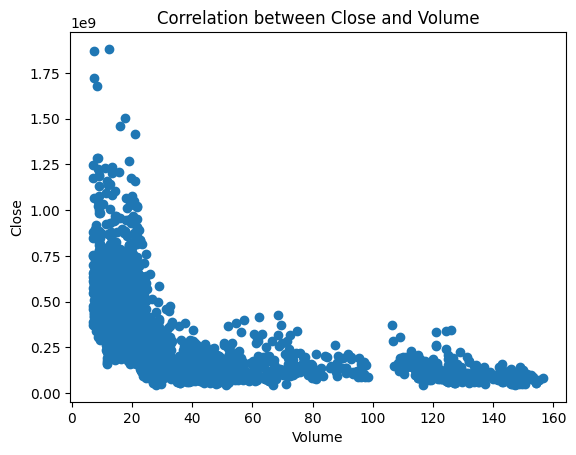

In [17]:
plt.scatter(df['Close'], df['Volume'])
plt.ylabel("Close")
plt.xlabel("Volume")
plt.title("Correlation between Close and Volume")

Text(0.5, 1.0, 'Correlation between High and Low')

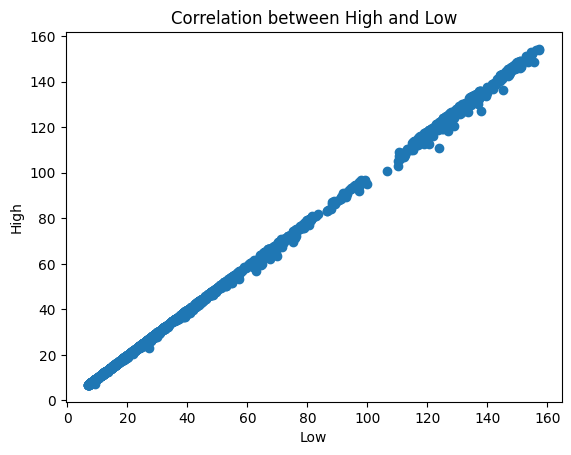

In [18]:
plt.scatter(df['High'], df['Low'])
plt.ylabel("High")
plt.xlabel("Low")
plt.title("Correlation between High and Low")

EDA

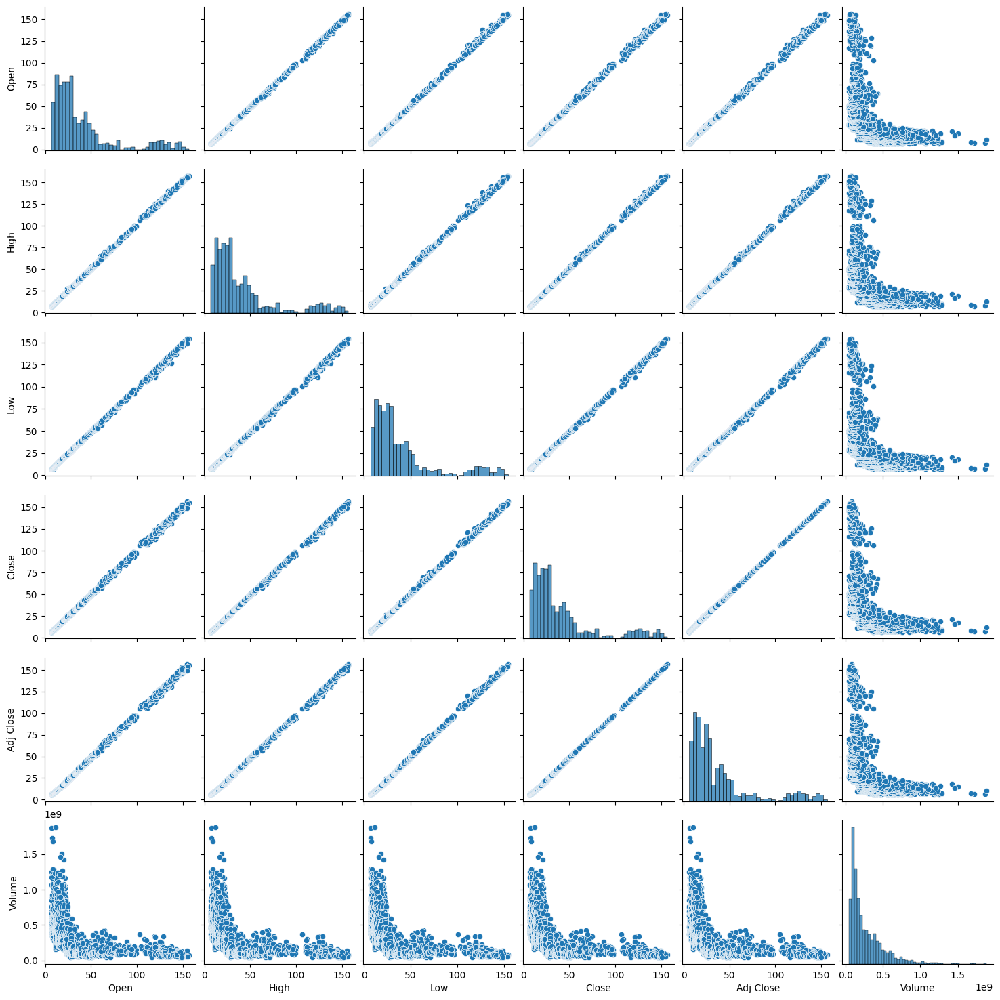

In [19]:
sns.pairplot(df)

<Axes: >

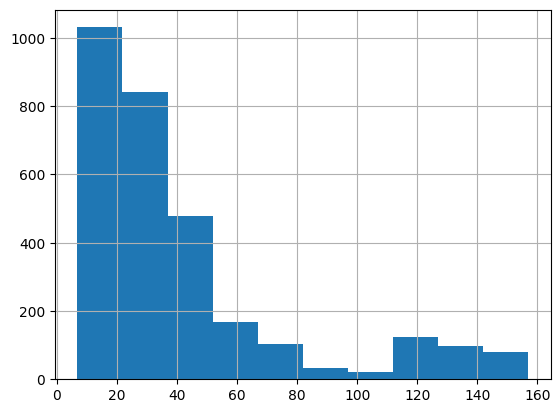

In [20]:
df['Open'].hist()

<Axes: >

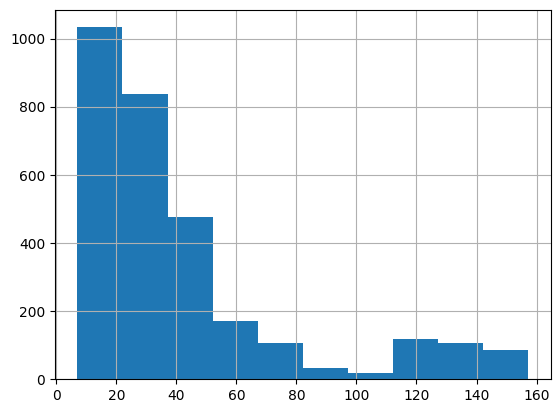

In [21]:
df['High'].hist()

<Axes: >

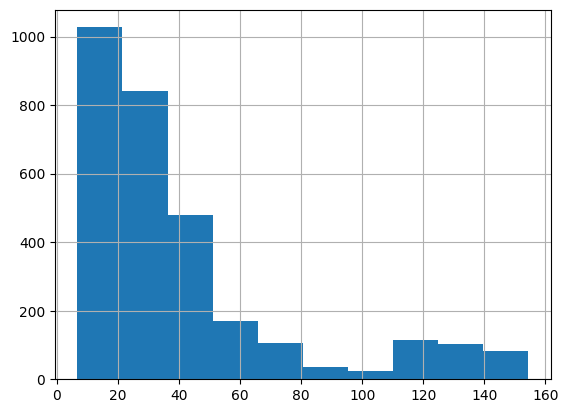

In [22]:
df['Low'].hist()

<Axes: >

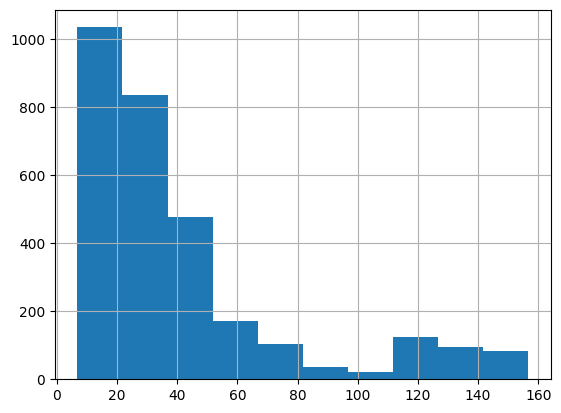

In [23]:
df['Close'].hist()

<Axes: >

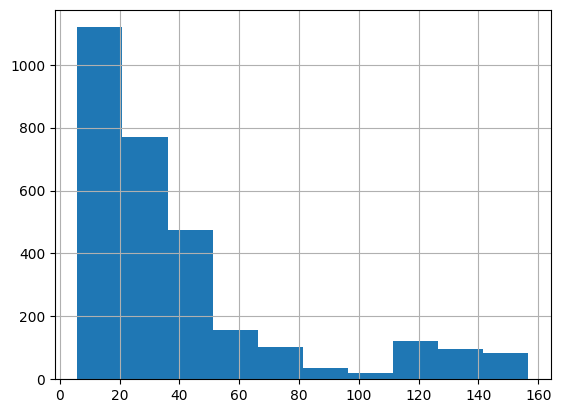

In [24]:
df['Adj Close'].hist()

<Axes: >

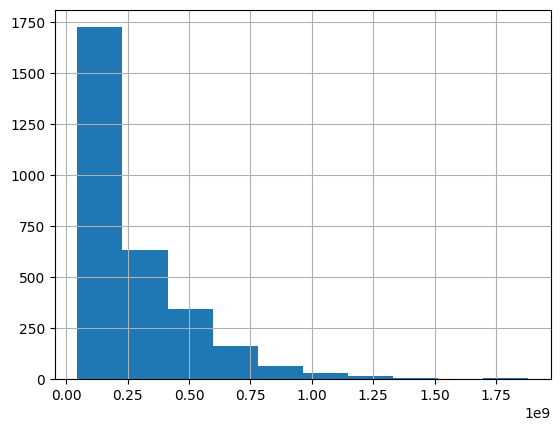

In [25]:
df['Volume'].hist()

In [26]:
df

,Date,Open,High,Low,Close,Adj Close,Volume
0,2010-01-04,7.622500,7.660714,7.585000,7.643214,6.562589,493729600
1,2010-01-05,7.664286,7.699643,7.616071,7.656429,6.573936,601904800
2,2010-01-06,7.656429,7.686786,7.526786,7.534643,6.469368,552160000
3,2010-01-07,7.562500,7.571429,7.466071,7.520714,6.457407,477131200
4,2010-01-08,7.510714,7.571429,7.466429,7.570714,6.500340,447610800
...,...,...,...,...,...,...,...
2975,2021-10-27,149.360001,149.729996,148.490005,148.850006,148.850006,56094900
2976,2021-10-28,149.820007,153.169998,149.720001,152.570007,152.570007,100077900
2977,2021-10-29,147.220001,149.940002,146.410004,149.800003,149.800003,124850400
2978,2021-11-01,148.990005,149.699997,147.800003,148.960007,148.960007,74445600


In [27]:
import plotly.graph_objects as go
figure = go.Figure(data=[go.Candlestick(x=data["Date"],
                                        open=data["Open"], high=data["High"],
                                        low=data["Low"], close=data["Close"])])
figure.update_layout(title = "Apple Stock Price Analysis", xaxis_rangeslider_visible=False)
figure.show()

# EDA

In [29]:
data = pd.read_csv("/content/drive/MyDrive/Date/AAPL.csv")
print(data.head())
data.info()

         Date      Open      High       Low     Close  Adj Close     Volume
0  2010-01-04  7.622500  7.660714  7.585000  7.643214   6.562589  493729600
1  2010-01-05  7.664286  7.699643  7.616071  7.656429   6.573936  601904800
2  2010-01-06  7.656429  7.686786  7.526786  7.534643   6.469368  552160000
3  2010-01-07  7.562500  7.571429  7.466071  7.520714   6.457407  477131200
4  2010-01-08  7.510714  7.571429  7.466429  7.570714   6.500340  447610800
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2980 entries, 0 to 2979
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2980 non-null   object 
 1   Open       2980 non-null   float64
 2   High       2980 non-null   float64
 3   Low        2980 non-null   float64
 4   Close      2980 non-null   float64
 5   Adj Close  2980 non-null   float64
 6   Volume     2980 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 163.1+ KB


In [30]:
data.isnull().sum()

,0
Date,0
Open,0
High,0
Low,0
Close,0
Adj Close,0
Volume,0


In [31]:
data['Date'] = pd.to_datetime(data['Date'], infer_datetime_format=True)

<ipython-input-31-b32d803c1797>:1: UserWarning:

The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.



In [32]:
%matplotlib inline
from matplotlib.pylab import rcParams
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

In [33]:

data=data.set_index(['Date'])
data.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,7.622500,7.660714,7.585000,7.643214,6.562589,493729600
2010-01-05,7.664286,7.699643,7.616071,7.656429,6.573936,601904800
2010-01-06,7.656429,7.686786,7.526786,7.534643,6.469368,552160000
2010-01-07,7.562500,7.571429,7.466071,7.520714,6.457407,477131200
2010-01-08,7.510714,7.571429,7.466429,7.570714,6.500340,447610800


In [34]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2980 entries, 2010-01-04 to 2021-11-02
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       2980 non-null   float64
 1   High       2980 non-null   float64
 2   Low        2980 non-null   float64
 3   Close      2980 non-null   float64
 4   Adj Close  2980 non-null   float64
 5   Volume     2980 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 163.0 KB


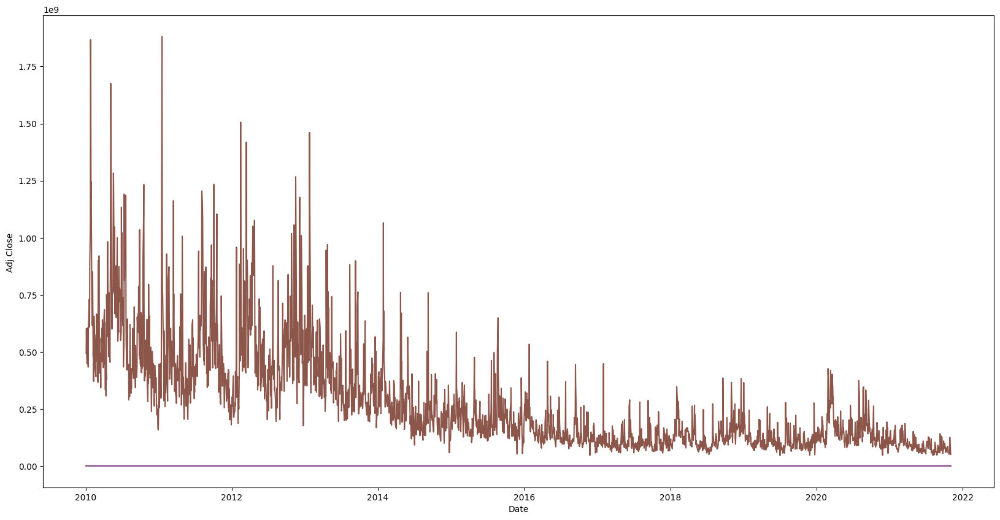

In [35]:
plt.figure(figsize=(20,10))
plt.xlabel("Date")
plt.ylabel("Adj Close ")
plt.plot(data)

In [36]:
rolmean=data.rolling(window=12).mean()
rolstd=data.rolling(window=12).std()
print(rolmean.head(15))
print(rolstd.head(15))

                Open      High       Low     Close  Adj Close        Volume
Date                                                                       
2010-01-04       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-05       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-06       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-07       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-08       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-11       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-12       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-13       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-14       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-15       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-19       NaN       NaN       NaN       NaN        NaN           NaN
2010-01-20  

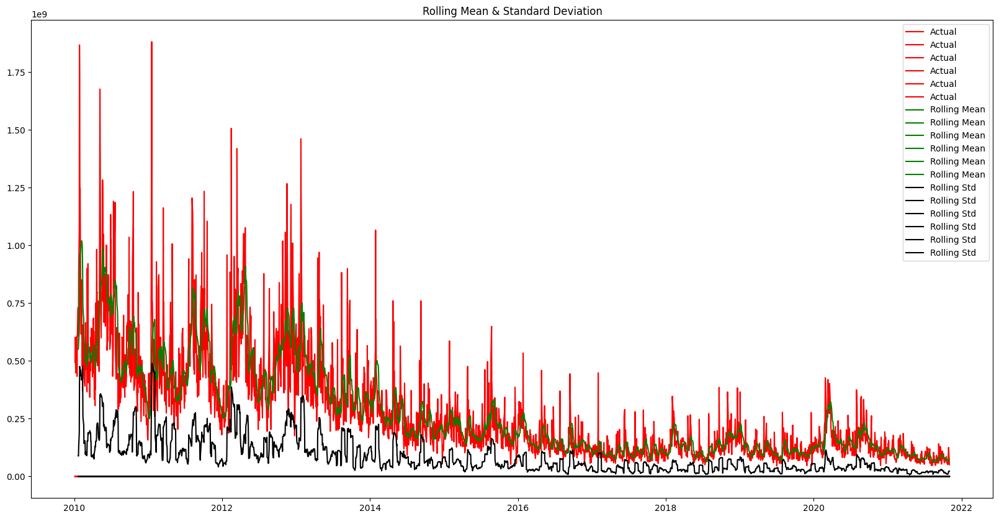

In [37]:
plt.figure(figsize=(20,10))
actual=plt.plot(data, color='red', label='Actual')
mean_6=plt.plot(rolmean, color='green', label='Rolling Mean')
std_6=plt.plot(rolstd, color='black', label='Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.show(block=False)

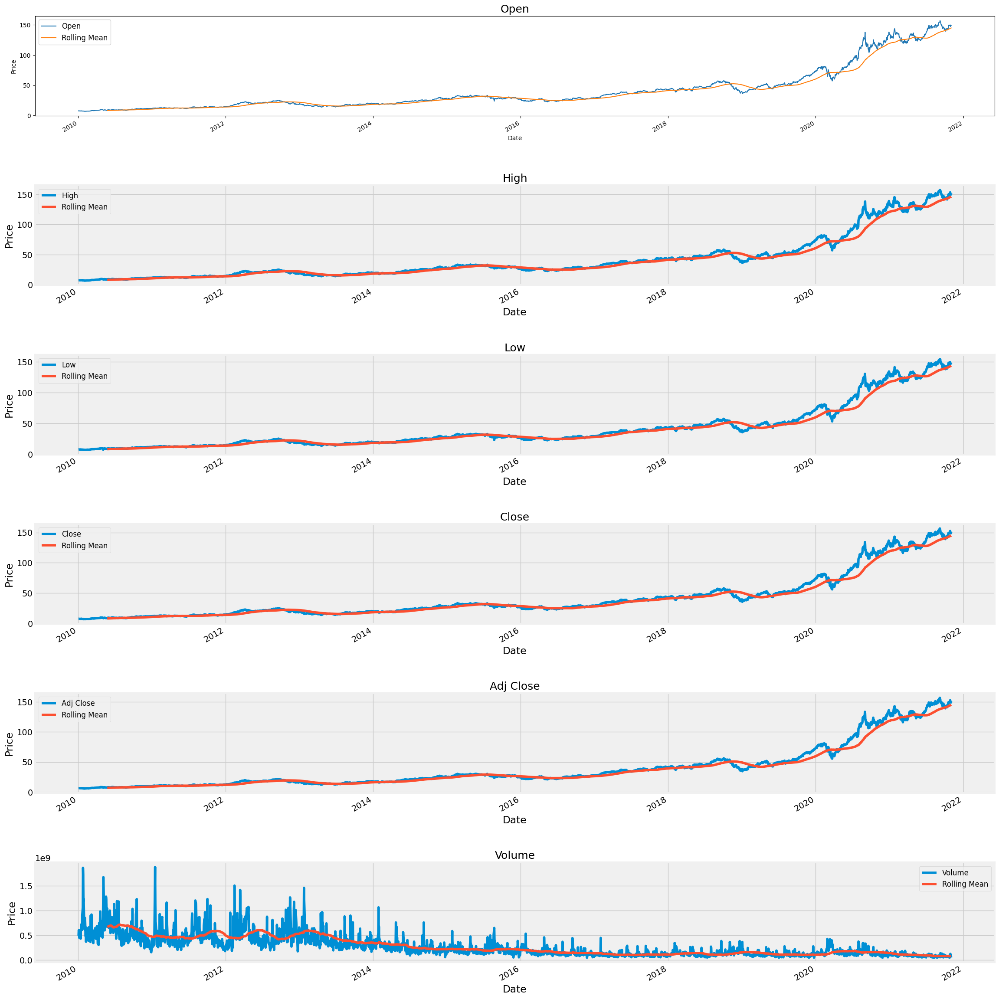

In [38]:
col_names = data.columns

fig = plt.figure(figsize=(24, 24))
for i in range(6):
  ax = fig.add_subplot(6,1,i+1)
  ax.plot(data.iloc[:,i],label=col_names[i])
  data.iloc[:,i].rolling(100).mean().plot(label='Rolling Mean')
  ax.set_title(col_names[i],fontsize=18)
  ax.set_xlabel('Date')
  ax.set_ylabel('Price')
  ax.patch.set_edgecolor('black')
  plt.style.context('fivethirtyeight')
  plt.legend(prop={'size': 12})
  plt.style.use('fivethirtyeight')

fig.tight_layout(pad=3.0)

plt.show()

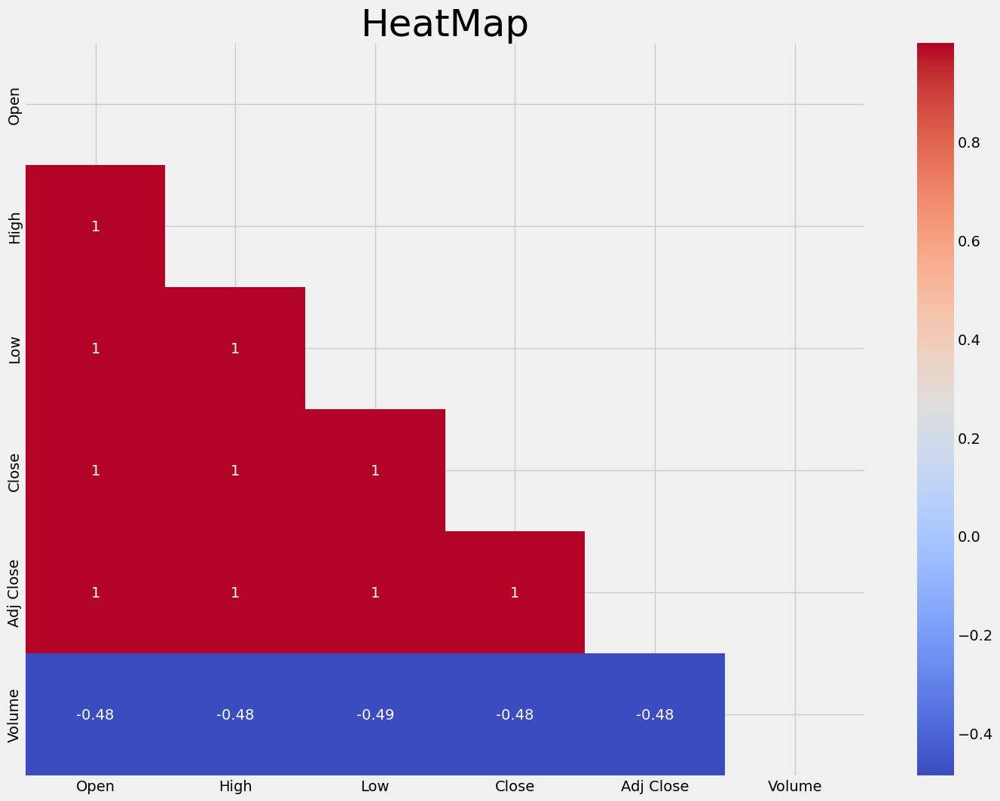

In [39]:
##HeatMap to Verify Multicollinearity between Features
fig = plt.figure(figsize=(16,12))
matrix = np.triu(data.corr())
ax = sns.heatmap(data.corr(),annot=True,annot_kws={"size":14},mask=matrix,cmap='coolwarm')
ax.tick_params(labelsize=14)
sns.set(font_scale=3)
ax.set_title('HeatMap')
plt.style.use('fivethirtyeight')
plt.show()

In [40]:
data_feature_selected = data.drop(axis=1,labels=['Open','High','Low','Close','Volume'])

In [41]:
col_order = ['Adj Close']
data_feature_selected = data_feature_selected.reindex(columns=col_order)
data_feature_selected

,Adj Close
Date,
2010-01-04,6.562589
2010-01-05,6.573936
2010-01-06,6.469368
2010-01-07,6.457407
2010-01-08,6.500340
...,...
2021-10-27,148.850006
2021-10-28,152.570007
2021-10-29,149.800003


In [42]:
##Resample Data to Monthly instead of Daily by Aggregating Using Mean
monthly_mean = data_feature_selected['Adj Close'].resample('M').mean()

In [43]:
monthly_data = monthly_mean.to_frame()
monthly_data

,Adj Close
Date,
2010-01-31,6.369562
2010-02-28,6.096047
2010-03-31,6.850866
2010-04-30,7.701438
2010-05-31,7.711035
...,...
2021-07-31,144.922394
2021-08-31,148.137819
2021-09-30,148.306190


In [44]:
monthly_data['Year'] = monthly_data.index.year
monthly_data['Month'] = monthly_data.index.strftime('%B')
monthly_data['dayofweek'] = monthly_data.index.strftime('%A')
monthly_data['quarter'] = monthly_data.index.quarter
monthly_data

,Adj Close,Year,Month,dayofweek,quarter
Date,,,,,
2010-01-31,6.369562,2010,January,Sunday,1
2010-02-28,6.096047,2010,February,Sunday,1
2010-03-31,6.850866,2010,March,Wednesday,1
2010-04-30,7.701438,2010,April,Friday,2
2010-05-31,7.711035,2010,May,Monday,2
...,...,...,...,...,...
2021-07-31,144.922394,2021,July,Saturday,3
2021-08-31,148.137819,2021,August,Tuesday,3
2021-09-30,148.306190,2021,September,Thursday,3


In [45]:
from sklearn.model_selection import train_test_split as split
import itertools
warnings.filterwarnings("ignore")
from IPython import display
from matplotlib import pyplot
import os
import re
#from colorama import Fore, Back, Style
import seaborn as sns
import plotly.express as px
import warnings
from matplotlib.patches import Patch

(array([0.   , 0.005, 0.01 , 0.015, 0.02 , 0.025, 0.03 ]),
 [Text(0, 0.0, '0.000'),
  Text(0, 0.005, '0.005'),
  Text(0, 0.01, '0.010'),
  Text(0, 0.015, '0.015'),
  Text(0, 0.02, '0.020'),
  Text(0, 0.025, '0.025'),
  Text(0, 0.03, '0.030')])

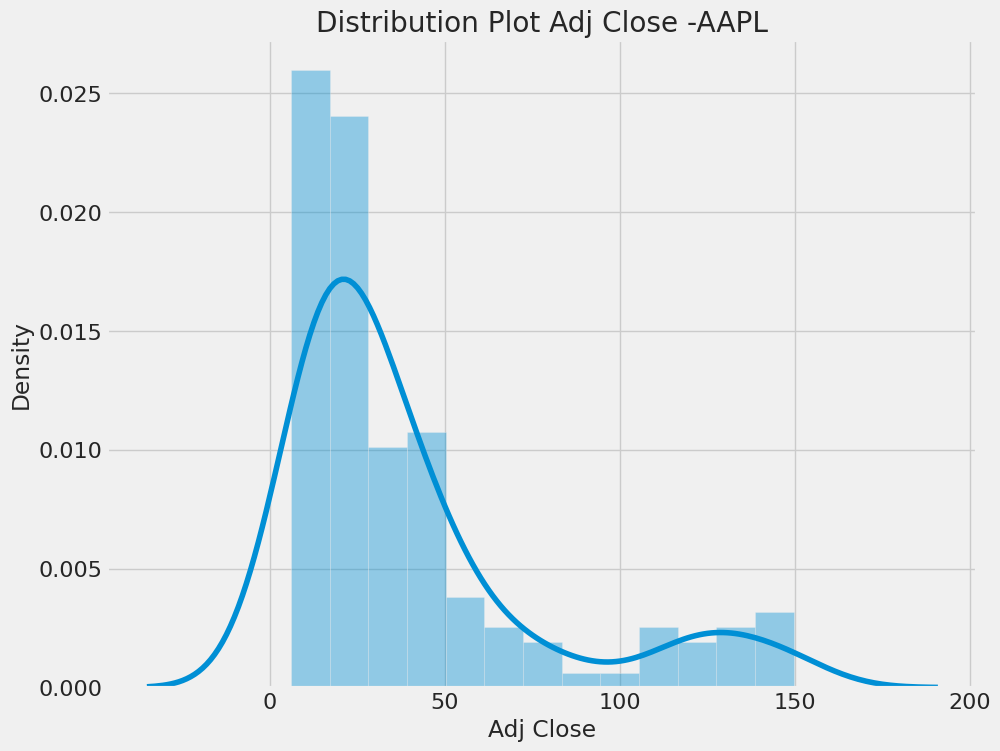

In [46]:
fig = plt.figure(figsize=(10,8))
sns.distplot(monthly_data['Adj Close']).set_title("Distribution Plot Adj Close -AAPL")
#ax.tick_params(labelsize=12)
sns.set(font_scale=1)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

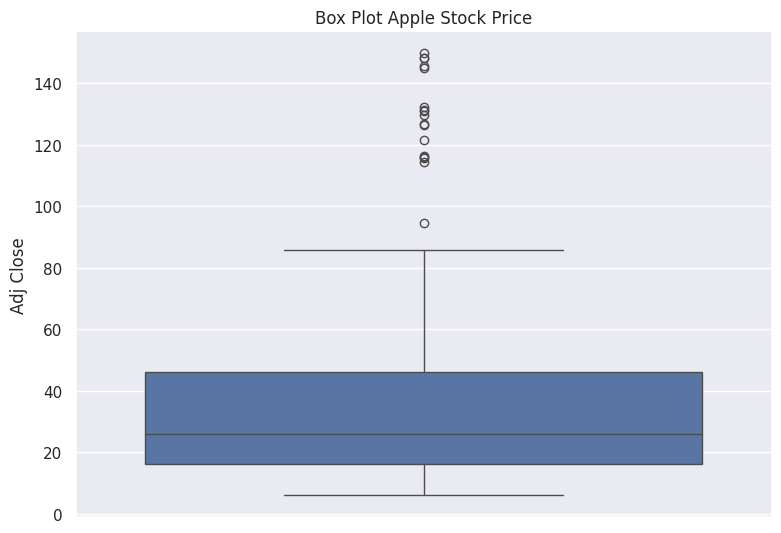

In [47]:
fig = plt.figure(figsize=(8,6))
sns.boxplot(monthly_data['Adj Close']).set_title('Box Plot Apple Stock Price')
plt.style.context('fivethirtyeight')

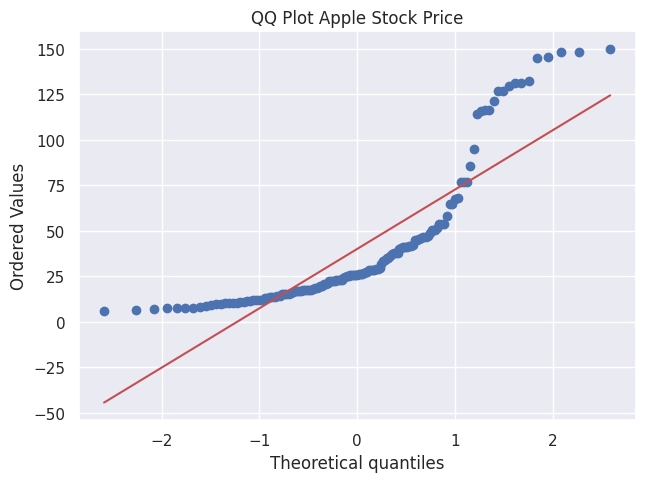

In [49]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

# Assuming monthly_data['Adj Close'] is a Pandas Series
stats.probplot(monthly_data['Adj Close'], dist="norm", plot=plt)
plt.title('QQ Plot Apple Stock Price')
plt.show()

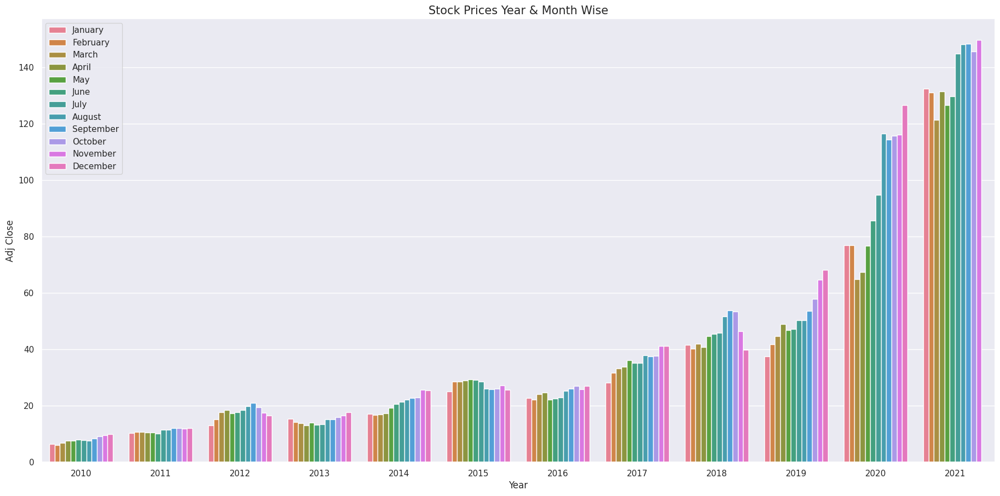

In [50]:
fig, ax = plt.subplots(figsize=(20,10))
palette = sns.color_palette("mako_r", 4)
a = sns.barplot(x="Year", y="Adj Close",hue = 'Month',data=monthly_data)
a.set_title("Stock Prices Year & Month Wise",fontsize=15)
plt.legend(loc='upper left')
plt.show()

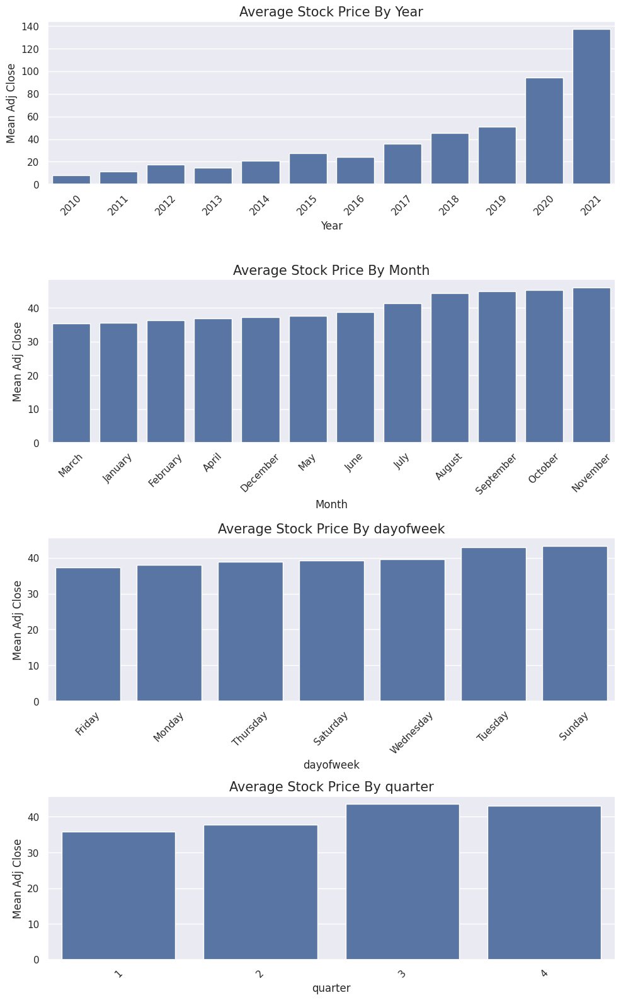

In [51]:
fig = plt.figure(figsize=(10,16))
fig.set_size_inches(10,16)
group_cols = monthly_data.columns

for enum,i in enumerate(group_cols[1:]):
  ax = fig.add_subplot(4,1,enum+1)
  Aggregated = pd.DataFrame(monthly_data.groupby(str(i))["Adj Close"].mean()).reset_index().sort_values('Adj Close')
  sns.barplot(data=Aggregated,x=str(i),y="Adj Close",ax=ax)
  ax.set(xlabel=str(i), ylabel='Mean Adj Close')
  ax.set_title("Average Stock Price By {}".format(str(i)),fontsize=15)
  plt.xticks(rotation=45)

plt.tight_layout(pad=1)

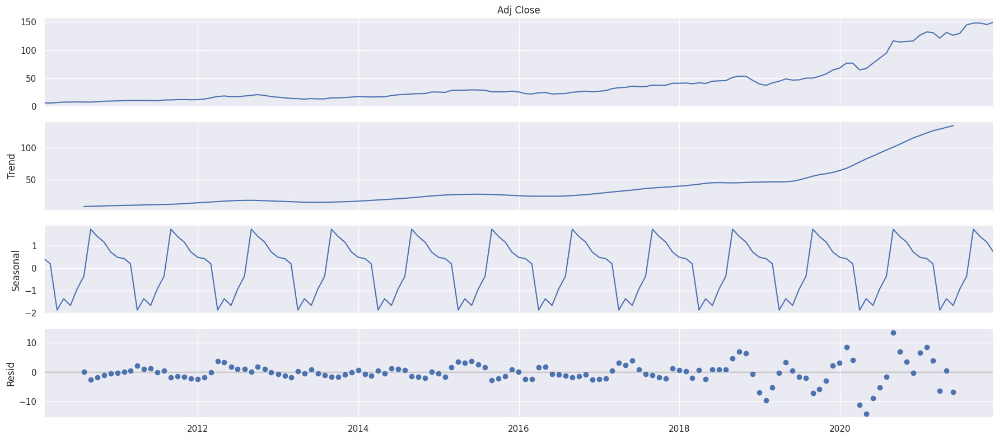

In [53]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose

# Set figure size
plt.rcParams['figure.figsize'] = 18, 8

# Decompose the time series (Assuming monthly_data['Adj Close'] is a Pandas Series)
decomposed_series = seasonal_decompose(monthly_data['Adj Close'], model='additive', period=12)

# Plot the decomposed components
decomposed_series.plot()
plt.show()

In [54]:
##ADF Test-Statsmodels Library

def ad_fuller_func(X):
  result_ad_fuller = adfuller(X)
  print('ADF Statistic: %f' % result_ad_fuller[0])
  print('p-value: %f' %result_ad_fuller[1])
  print('Critical Values:')
  for key, value in result_ad_fuller[4].items():
	  print('\t%s: %.3f' % (key, value))

  if result_ad_fuller[0] < result_ad_fuller[4]['5%']:
    print('Reject Null Hypothesis(Ho)-Time Series is Stationary')
  else:
    print('Failed to Reject Ho-Time Series is Non-Stationary')

In [62]:
from statsmodels.tsa.stattools import adfuller

# Perform the Augmented Dickey-Fuller test
result = adfuller(monthly_data['Adj Close'])

# Display the results
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:', result[4])

ADF Statistic: 1.7390728420465629
p-value: 0.9982202037131901
Critical Values: {'1%': -3.4816817173418295, '5%': -2.8840418343195267, '10%': -2.578770059171598}


Time Series is Not Stationary as observed earlier also by Decomposition(Trend and Seasonality Present)


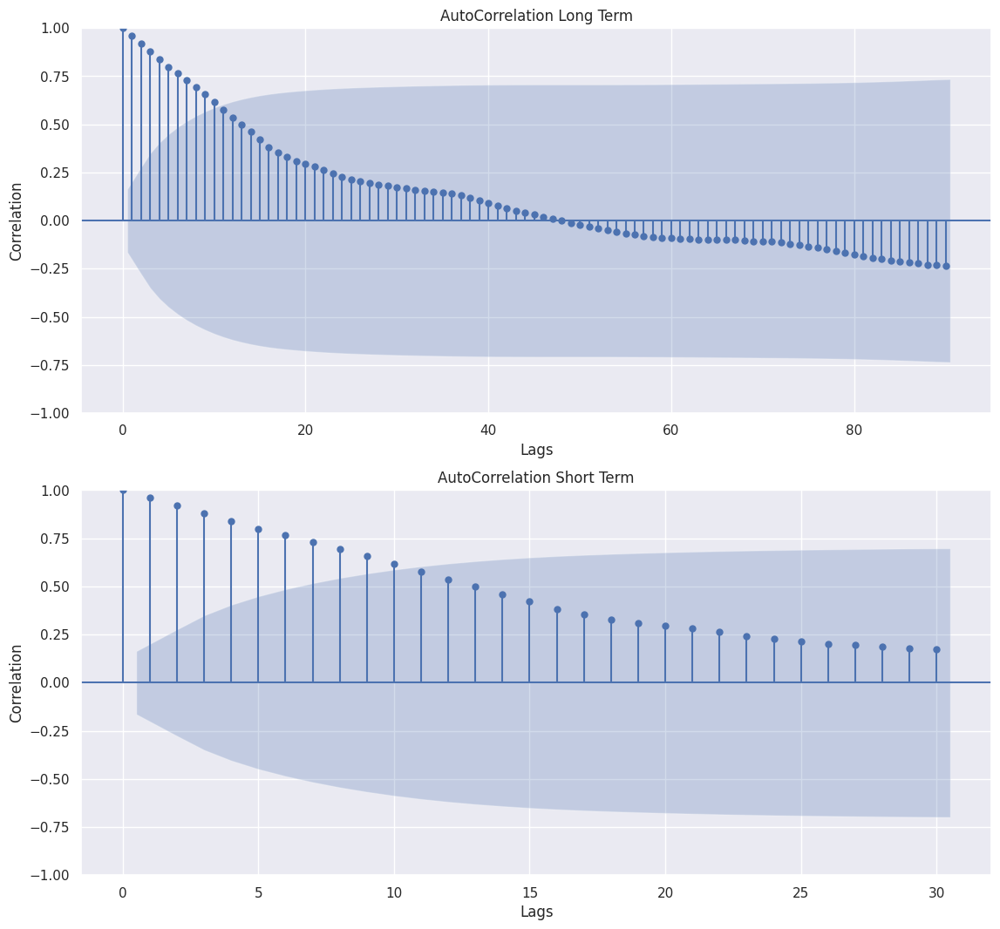

In [64]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# Create subplots
fig, (ax1, ax2) = plt.subplots(2, figsize=(12, 12))

# Plot the AutoCorrelation function (ACF) for long-term lags (90)
plot_acf(monthly_data['Adj Close'], lags=90, ax=ax1)
ax1.set_title('AutoCorrelation Long Term')
ax1.set_ylabel('Correlation')
ax1.set_xlabel('Lags')

# Plot the AutoCorrelation function (ACF) for short-term lags (30)
plot_acf(monthly_data['Adj Close'], lags=30, ax=ax2)
ax2.set_title('AutoCorrelation Short Term')
ax2.set_ylabel('Correlation')
ax2.set_xlabel('Lags')

# Show the plot
plt.show()

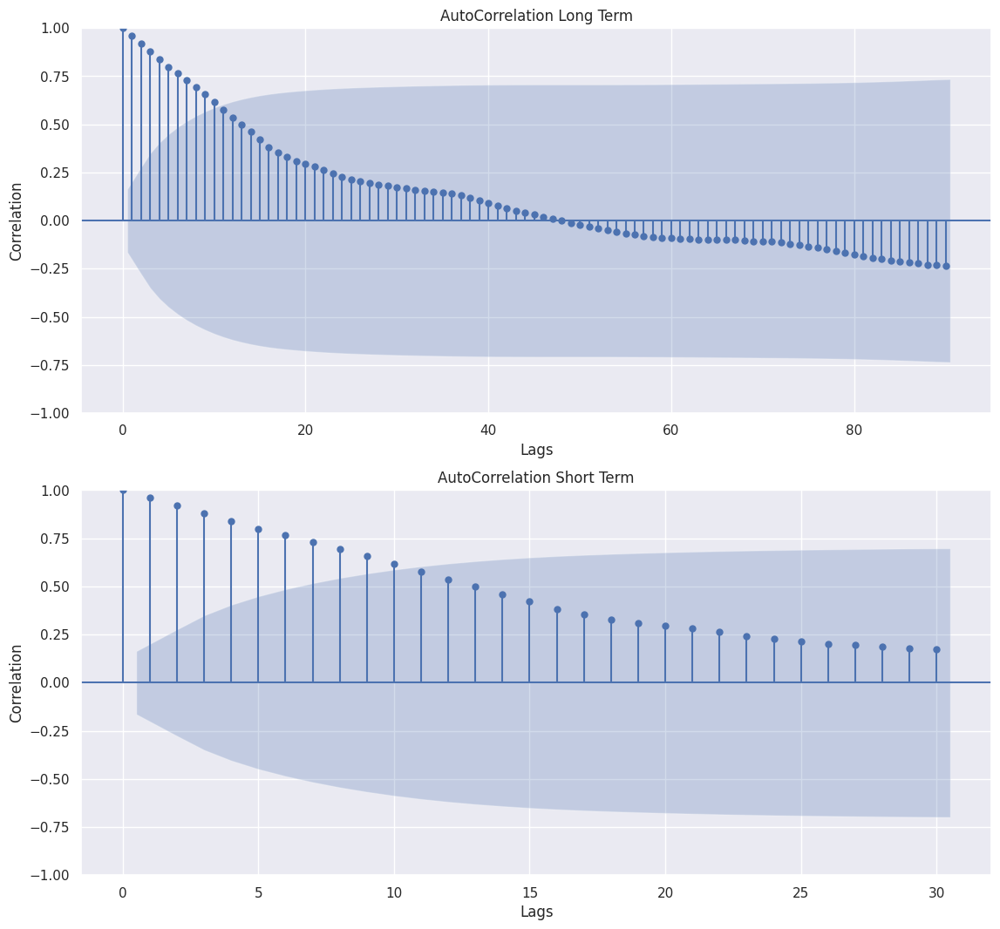

In [66]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# Create subplots
fig, (ax1, ax2) = plt.subplots(2, figsize=(12, 12))

# Plot the AutoCorrelation function (ACF) for long-term lags (90)
plot_acf(monthly_data['Adj Close'], lags=90, ax=ax1)
ax1.set_title('AutoCorrelation Long Term')
ax1.set_ylabel('Correlation')
ax1.set_xlabel('Lags')

# Plot the AutoCorrelation function (ACF) for short-term lags (30)
plot_acf(monthly_data['Adj Close'], lags=30, ax=ax2)
ax2.set_title('AutoCorrelation Short Term')
ax2.set_ylabel('Correlation')
ax2.set_xlabel('Lags')

# Show the plot
plt.show()

In [67]:
##Differencing By 1. To make it stationary
monthly_data['monthly_diff'] = monthly_data['Adj Close'] - monthly_data['Adj Close'].shift(1)

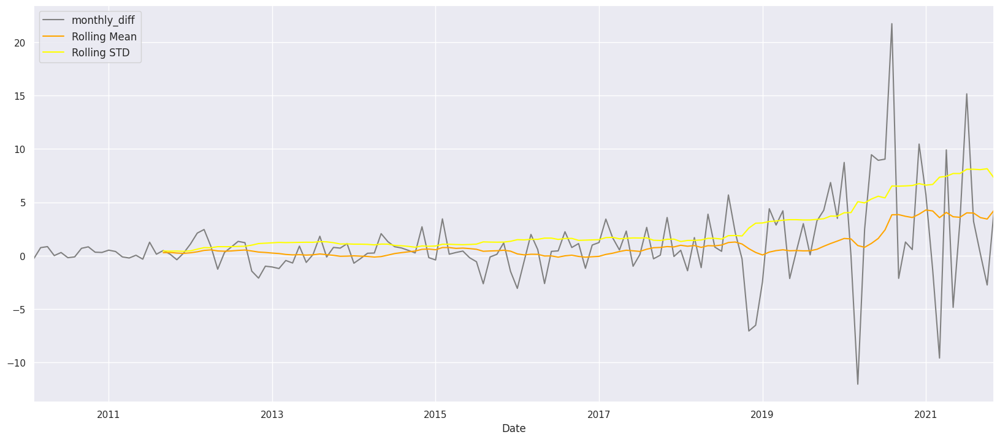

In [68]:
monthly_data['monthly_diff'][1:].plot(c='grey')
monthly_data['monthly_diff'][1:].rolling(20).mean().plot(label='Rolling Mean',c='orange')
monthly_data['monthly_diff'][1:].rolling(20).std().plot(label='Rolling STD',c='yellow')
plt.legend(prop={'size': 12})

In [69]:
##Checking if Time Series is Stationary by Running ADF Test
ad_fuller_func(monthly_data['monthly_diff'][1:])

ADF Statistic: -1.856669
p-value: 0.352712
Critical Values:
	1%: -3.482
	5%: -2.884
	10%: -2.579
Failed to Reject Ho-Time Series is Non-Stationary


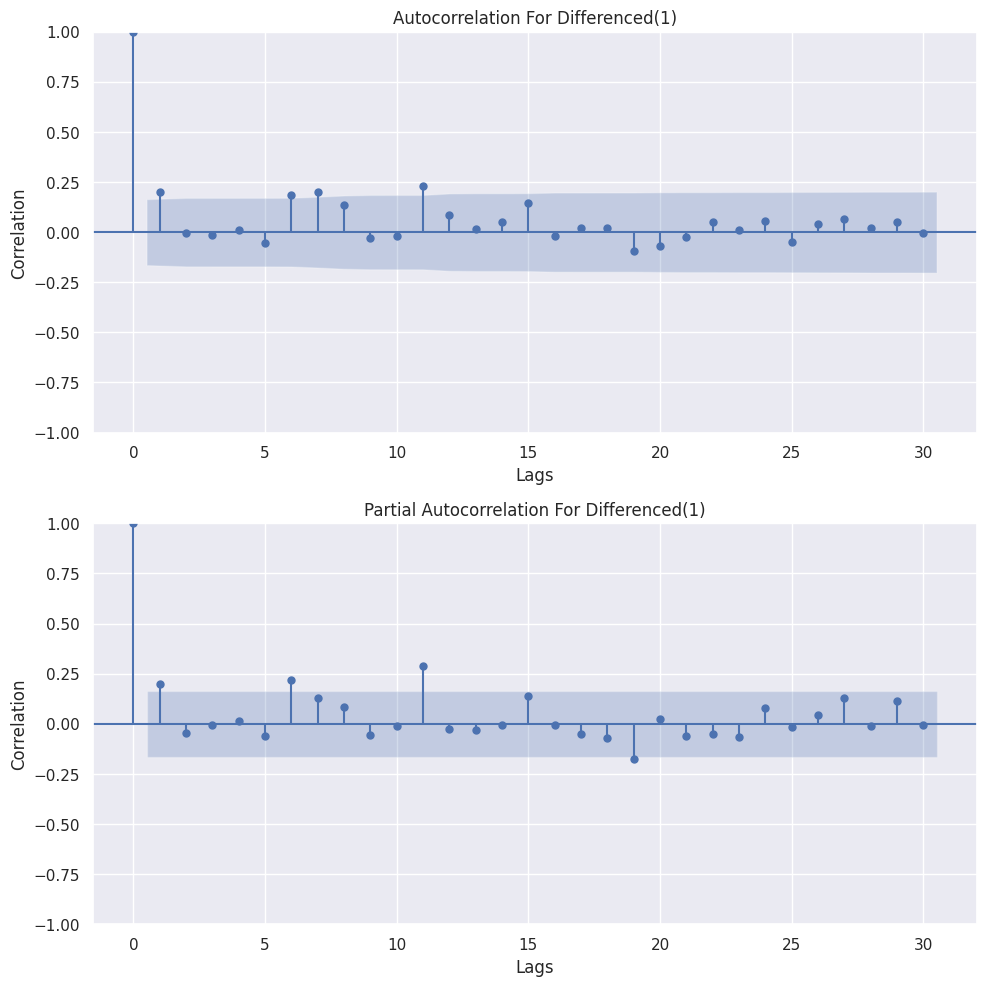

In [71]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Assuming 'monthly_data' has the 'Adj Close' column and you want to first difference it
monthly_data['monthly_diff'] = monthly_data['Adj Close'].diff()  # First differencing the data

# Create subplots
fig, (ax1, ax2) = plt.subplots(2, figsize=(10, 10))

# Plot the ACF for the first-differenced series
plot_acf(monthly_data['monthly_diff'].dropna(), lags=30, ax=ax1)
ax1.set_title('Autocorrelation For Differenced(1)')
ax1.set_ylabel('Correlation')
ax1.set_xlabel('Lags')

# Plot the PACF for the first-differenced series
plot_pacf(monthly_data['monthly_diff'].dropna(), lags=30, ax=ax2)
ax2.set_title('Partial Autocorrelation For Differenced(1)')
ax2.set_ylabel('Correlation')
ax2.set_xlabel('Lags')

# Adjust layout to prevent overlap
plt.tight_layout(pad=1)

# Show the plot
plt.show()

In [72]:
from statsmodels.tsa.stattools import kpss

In [73]:
# KPSS test
from statsmodels.tsa.stattools import kpss
def kpss_test(series, **kw):
    statistic, p_value, n_lags, critical_values = kpss(series, **kw)
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary')

kpss_test(monthly_data['monthly_diff'][1:])

KPSS Statistic: 0.8286083434207704
p-value: 0.01
num lags: 2
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary


In [74]:
# KPSS test
from statsmodels.tsa.stattools import kpss
def kpss_test(series, **kw):
    statistic, p_value, n_lags, critical_values = kpss(series, **kw)
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary')

kpss_test(monthly_data['monthly_diff'][1:])

KPSS Statistic: 0.8286083434207704
p-value: 0.01
num lags: 2
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary


In [75]:
from scipy import stats
from scipy.special import inv_boxcox
from typing import Tuple
import lightgbm as lgb
from datetime import timedelta

# Transform to make stationary

In [76]:
# Define power trnnsformations and their inverses
# Square root transformation
def square_root_transformation(x: pd.Series) -> pd.Series:
    return np.sqrt(x)

def square_root_inverse_transformation(x: pd.Series) -> pd.Series:
    return np.square(x)

# Cube root transformation
def cube_root_transformation(x: pd.Series) -> pd.Series:
    return x ** (1 / 3)

def cube_root_inverse_transformation(x: pd.Series) -> pd.Series:
    return x ** 3

# Log transformation
def log_transformation(x: pd.Series) -> pd.Series:
    # Function np.log1p = log(x + 1)
    return np.log1p(x)

def log_inverse_transformation(x: pd.Series) -> pd.Series:
    # Function np.expm1(x) = exp(x) - 1
    return np.expm1(x)

# Box-cox transformation
def box_cox_transformation(x: pd.Series) -> Tuple[np.array, float]:
    x_transformed, lambda_value = stats.boxcox(x)
    return x_transformed, lambda_value

def box_cox_inverse_transformation(x: pd.Series, lambda_value: float) -> pd.Series:
    return inv_boxcox(x, lambda_value)

In [77]:
monthly_data.reset_index(inplace=True)

In [78]:
#data['square_root_inv_transformation_demand'] = data.groupby('id')['square_root_transformation_demand'].apply(lambda x: square_root_inverse_transformation(x))

In [79]:
monthly_data['square_root_transformation_demand'] = monthly_data['Adj Close'].apply(lambda x: square_root_transformation(x))

# Apply the inverse square root transformation
monthly_data['square_root_inv_transformation_demand'] = monthly_data['square_root_transformation_demand'].apply(lambda x: square_root_inverse_transformation(x))

# Cube Root
monthly_data['cube_root_transformation_demand'] = monthly_data['Adj Close'].apply(lambda x: cube_root_transformation(x))

# Apply the inverse square root transformation
monthly_data['cube_root_inv_transformation_demand'] = monthly_data['cube_root_transformation_demand'].apply(lambda x: cube_root_inverse_transformation(x))

# Log Root
monthly_data['log_transformation_demand'] = monthly_data['Adj Close'].apply(lambda x: log_transformation(x))

# Apply the inverse square root transformation
monthly_data['log_inv_transformation_demand'] = monthly_data['log_transformation_demand'].apply(lambda x: log_inverse_transformation(x))






In [80]:
monthly_data

,Date,Adj Close,Year,Month,dayofweek,quarter,monthly_diff,square_root_transformation_demand,square_root_inv_transformation_demand,cube_root_transformation_demand,cube_root_inv_transformation_demand,log_transformation_demand,log_inv_transformation_demand
0,2010-01-31,6.369562,2010,January,Sunday,1,NaN,2.523799,6.369562,1.853688,6.369562,1.997358,6.369562
1,2010-02-28,6.096047,2010,February,Sunday,1,-0.273515,2.469017,6.096047,1.826765,6.096047,1.959538,6.096047
2,2010-03-31,6.850866,2010,March,Wednesday,1,0.754818,2.617416,6.850866,1.899249,6.850866,2.060624,6.850866
3,2010-04-30,7.701438,2010,April,Friday,2,0.850573,2.775147,7.701438,1.974804,7.701438,2.163488,7.701438
4,2010-05-31,7.711035,2010,May,Monday,2,0.009596,2.776875,7.711035,1.975624,7.711035,2.164591,7.711035
...,...,...,...,...,...,...,...,...,...,...,...,...,...
138,2021-07-31,144.922394,2021,July,Saturday,3,15.158177,12.038372,144.922394,5.252650,144.922394,4.983075,144.922394
139,2021-08-31,148.137819,2021,August,Tuesday,3,3.215425,12.171188,148.137819,5.291214,148.137819,5.004871,148.137819
140,2021-09-30,148.306190,2021,September,Thursday,3,0.168371,12.178103,148.306190,5.293218,148.306190,5.005999,148.306190
141,2021-10-31,145.563809,2021,October,Sunday,4,-2.742381,12.064983,145.563809,5.260388,145.563809,4.987461,145.563809


In [81]:
FIGURE_SIZE = (20, 10)
plt.rcParams['axes.grid'] = True

%matplotlib inline

In [82]:
def plot_transformations(df: pd.DataFrame, transformation: str) -> None:
    # Get axes for multiple plots
    fig, axes = plt.subplots(nrows=1, ncols=3)

    # Original data
    monthly_data.set_index('Date')['Adj Close'].plot(figsize=FIGURE_SIZE, ax=axes[0], color='blue')

    # Transformed data
    transformed_column_name = f'{transformation}_transformation_demand'
    monthly_data.set_index('Date')[transformed_column_name].plot(figsize=FIGURE_SIZE, ax=axes[1], color='red')

    # Inverse Transformed data
    inverse_transformed_data = f'{transformation}_inv_transformation_demand'
    monthly_data.set_index('Date')[inverse_transformed_data].plot(figsize=FIGURE_SIZE, ax=axes[2], color='orange')

In [83]:
#monthly_data.reset_index(inplace=True) # if plot did not show reset index

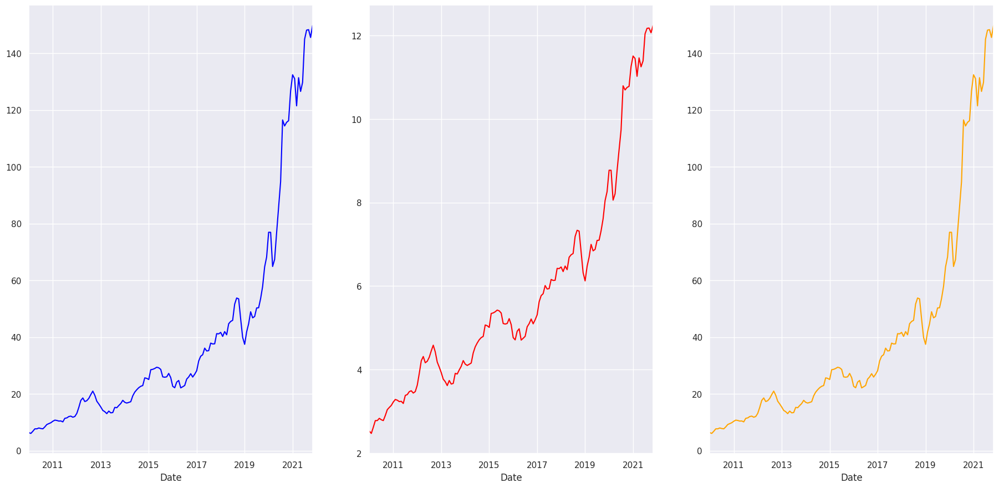

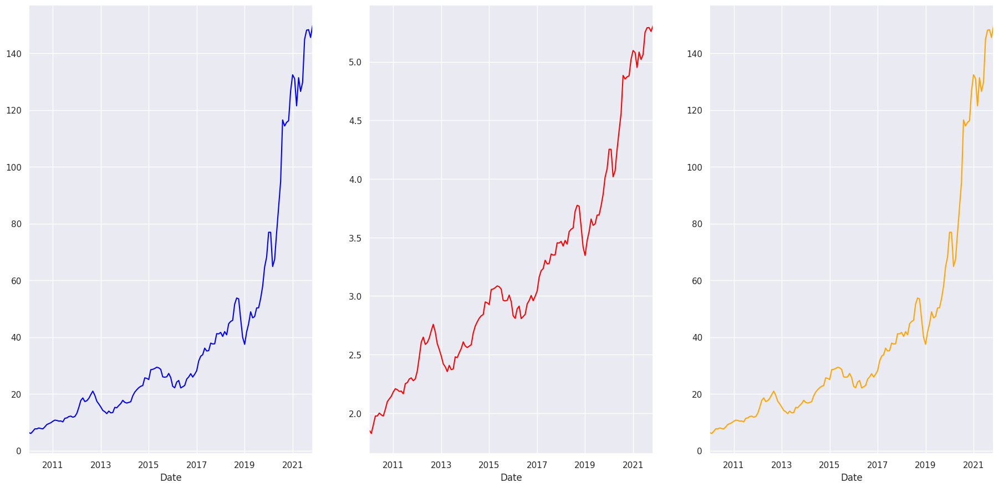

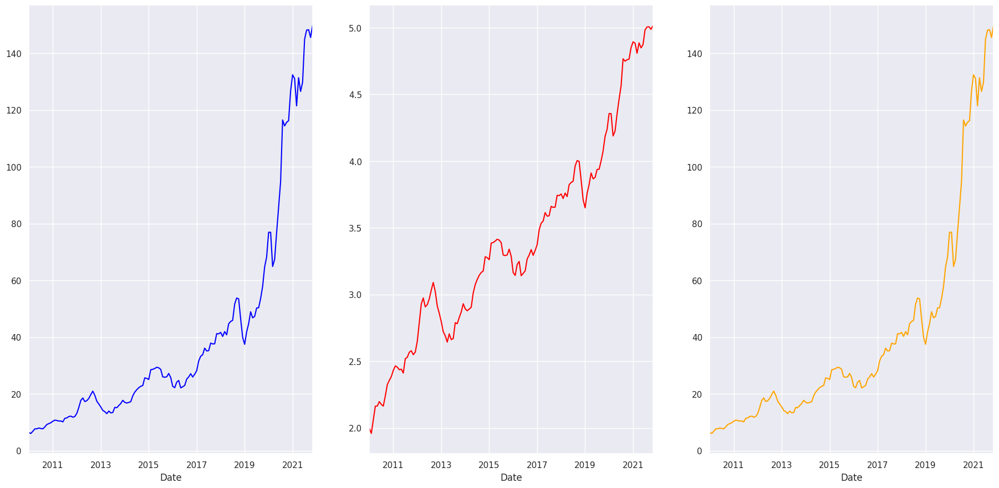

In [84]:
plot_transformations(monthly_data,'square_root') #  square_root log
plot_transformations(monthly_data, 'cube_root')
plot_transformations(monthly_data, 'log')



<Axes: xlabel='Date'>

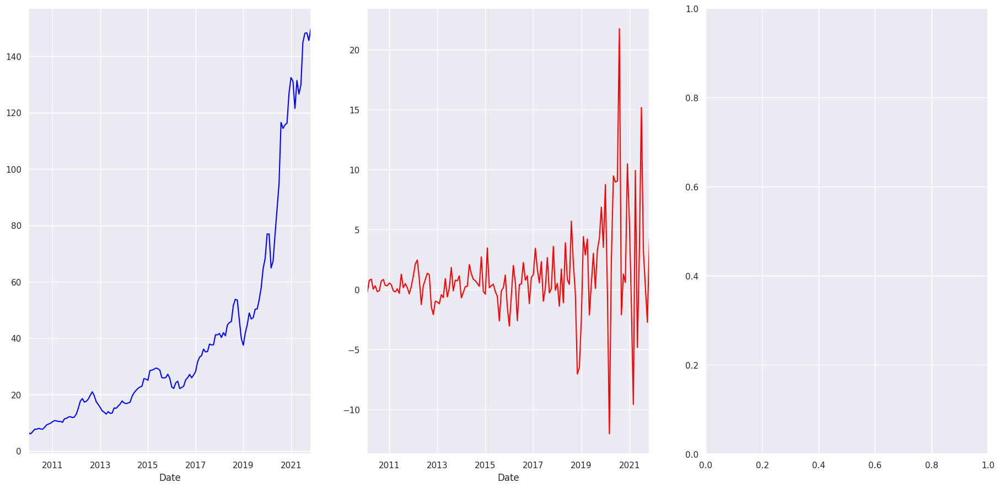

In [85]:
# Get axes for multiple plots
fig, axes = plt.subplots(nrows=1, ncols=3)

    # Original data
monthly_data.set_index('Date')['Adj Close'].plot(figsize=FIGURE_SIZE, ax=axes[0], color='blue')

    # Transformed data
transformed_column_name = 'monthly_diff'
monthly_data.set_index('Date')[transformed_column_name][1:].plot(figsize=FIGURE_SIZE, ax=axes[1], color='red')

#     # Inverse Transformed data
# inverse_transformed_data = f'{transformation}_inv_transformation_demand'
#  monthly_data.set_index('Date')[inverse_transformed_data].plot(figsize=FIGURE_SIZE, ax=axes[2], color='orange')

<Axes: xlabel='Date'>

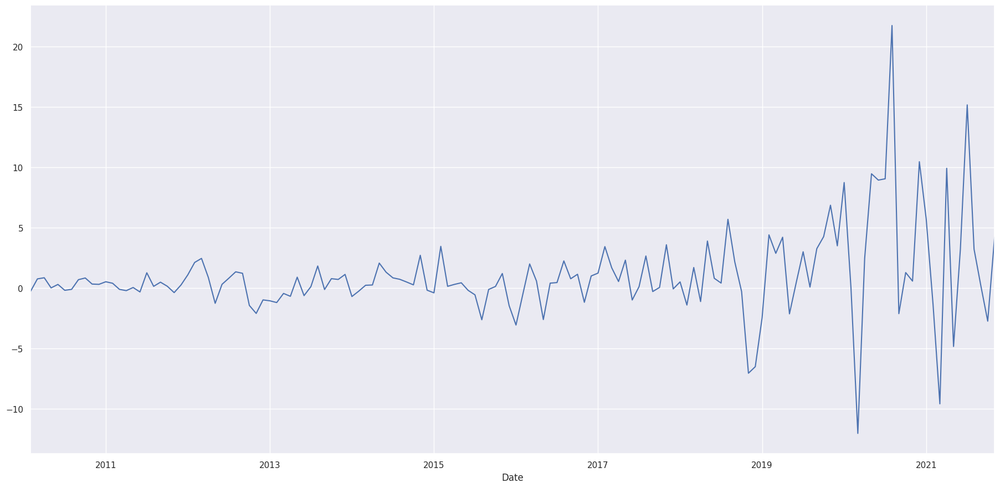

In [86]:
monthly_data.set_index('Date')['monthly_diff'][1:].plot(figsize=FIGURE_SIZE)

<Axes: xlabel='Date'>

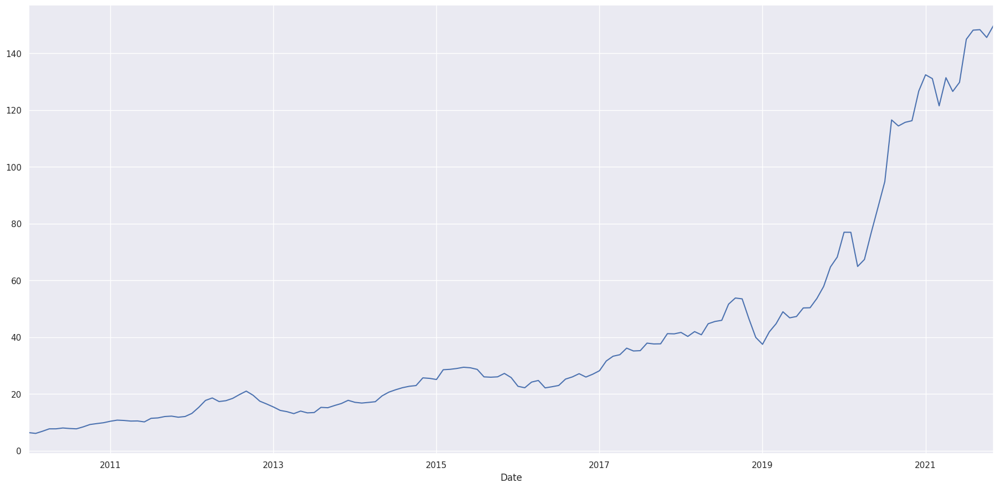

In [87]:
monthly_data.set_index('Date')['Adj Close'].plot(figsize=FIGURE_SIZE)

In [88]:
monthly_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143 entries, 0 to 142
Data columns (total 13 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   Date                                   143 non-null    datetime64[ns]
 1   Adj Close                              143 non-null    float64       
 2   Year                                   143 non-null    int32         
 3   Month                                  143 non-null    object        
 4   dayofweek                              143 non-null    object        
 5   quarter                                143 non-null    int32         
 6   monthly_diff                           142 non-null    float64       
 7   square_root_transformation_demand      143 non-null    float64       
 8   square_root_inv_transformation_demand  143 non-null    float64       
 9   cube_root_transformation_demand        143 non-null    float64   

In [89]:
# KPSS test
from statsmodels.tsa.stattools import kpss
def kpss_test(series, **kw):
    statistic, p_value, n_lags, critical_values = kpss(series, **kw)
    # Format Output
    print(f'KPSS Statistic: {statistic}')
    print(f'p-value: {p_value}')
    print(f'num lags: {n_lags}')
    print('Critial Values:')
    for key, value in critical_values.items():
        print(f'   {key} : {value}')
    print(f'Result: The series is {"not " if p_value < 0.05 else ""}stationary')

kpss_test(monthly_data['monthly_diff'][1:])

KPSS Statistic: 0.8286083434207704
p-value: 0.01
num lags: 2
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary


In [90]:
kpss_test(monthly_data['log_transformation_demand'])
print(" ***  ")
print(" ***  ")
kpss_test(monthly_data['cube_root_transformation_demand'])
print(" ***  ")
print(" ***  ")
kpss_test(monthly_data['square_root_transformation_demand'])


KPSS Statistic: 1.5920210223524793
p-value: 0.01
num lags: 8
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary
 ***  
 ***  
KPSS Statistic: 1.5175805405952847
p-value: 0.01
num lags: 8
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary
 ***  
 ***  
KPSS Statistic: 1.4614510785719967
p-value: 0.01
num lags: 8
Critial Values:
   10% : 0.347
   5% : 0.463
   2.5% : 0.574
   1% : 0.739
Result: The series is not stationary


In [91]:
def stationarity(timeseries):

    rolmean=timeseries.rolling(window=12).mean()
    rolstd=timeseries.rolling(window=12).std()

    plt.figure(figsize=(20,10))
    actual=plt.plot(timeseries, color='red', label='Actual')
    mean_6=plt.plot(rolmean, color='green', label='Rolling Mean')
    std_6=plt.plot(rolstd, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    print('Dickey-Fuller Test: ')
    dftest=adfuller(timeseries[1:], autolag='AIC') #BIC
    dfoutput=pd.Series(dftest[0:4], index=['Test Statistic','p-value','Lags Used','No. of Obs'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

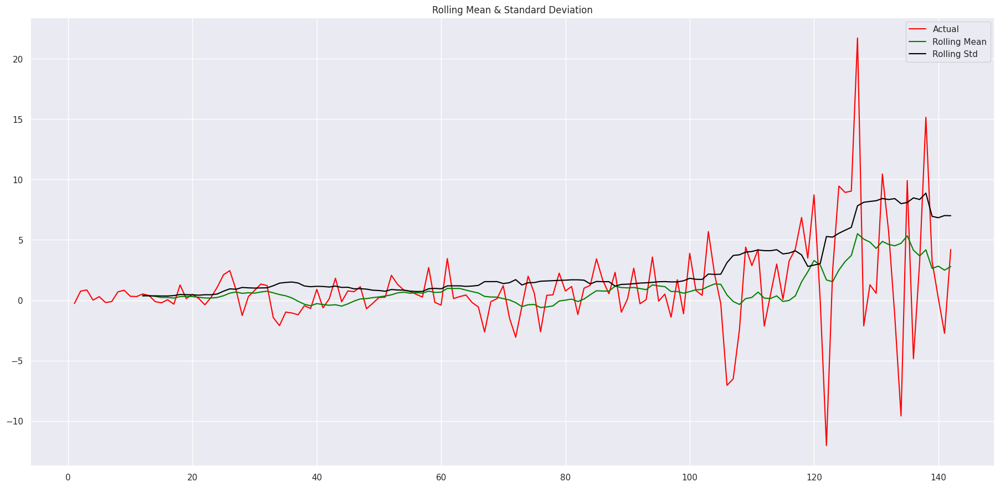

Dickey-Fuller Test: 
Test Statistic           -1.851527
p-value                   0.355196
Lags Used                11.000000
No. of Obs              129.000000
Critical Value (1%)      -3.482088
Critical Value (5%)      -2.884219
Critical Value (10%)     -2.578864
dtype: float64


In [92]:
stationarity(monthly_data['monthly_diff'][1:])

In [93]:
monthly_data['differenced_trasnformation_demand'] = monthly_data['Adj Close'].diff().values
monthly_data.head()

,Date,Adj Close,Year,Month,dayofweek,quarter,monthly_diff,square_root_transformation_demand,square_root_inv_transformation_demand,cube_root_transformation_demand,cube_root_inv_transformation_demand,log_transformation_demand,log_inv_transformation_demand,differenced_trasnformation_demand
0,2010-01-31,6.369562,2010,January,Sunday,1,NaN,2.523799,6.369562,1.853688,6.369562,1.997358,6.369562,NaN
1,2010-02-28,6.096047,2010,February,Sunday,1,-0.273515,2.469017,6.096047,1.826765,6.096047,1.959538,6.096047,-0.273515
2,2010-03-31,6.850866,2010,March,Wednesday,1,0.754818,2.617416,6.850866,1.899249,6.850866,2.060624,6.850866,0.754818
3,2010-04-30,7.701438,2010,April,Friday,2,0.850573,2.775147,7.701438,1.974804,7.701438,2.163488,7.701438,0.850573
4,2010-05-31,7.711035,2010,May,Monday,2,0.009596,2.776875,7.711035,1.975624,7.711035,2.164591,7.711035,0.009596


In [94]:
monthly_data['differenced_demand_filled'] = np.where(pd.isnull(monthly_data['differenced_trasnformation_demand']), monthly_data['Adj Close'], monthly_data['differenced_trasnformation_demand'])
monthly_data.head()

,Date,Adj Close,Year,Month,dayofweek,quarter,monthly_diff,square_root_transformation_demand,square_root_inv_transformation_demand,cube_root_transformation_demand,cube_root_inv_transformation_demand,log_transformation_demand,log_inv_transformation_demand,differenced_trasnformation_demand,differenced_demand_filled
0,2010-01-31,6.369562,2010,January,Sunday,1,NaN,2.523799,6.369562,1.853688,6.369562,1.997358,6.369562,NaN,6.369562
1,2010-02-28,6.096047,2010,February,Sunday,1,-0.273515,2.469017,6.096047,1.826765,6.096047,1.959538,6.096047,-0.273515,-0.273515
2,2010-03-31,6.850866,2010,March,Wednesday,1,0.754818,2.617416,6.850866,1.899249,6.850866,2.060624,6.850866,0.754818,0.754818
3,2010-04-30,7.701438,2010,April,Friday,2,0.850573,2.775147,7.701438,1.974804,7.701438,2.163488,7.701438,0.850573,0.850573
4,2010-05-31,7.711035,2010,May,Monday,2,0.009596,2.776875,7.711035,1.975624,7.711035,2.164591,7.711035,0.009596,0.009596


In [95]:
monthly_data['differenced_inv_transformation_demand'] = monthly_data['differenced_demand_filled'].cumsum()
np.testing.assert_array_equal(monthly_data['Adj Close'].values, monthly_data['differenced_inv_transformation_demand'].values)

In [96]:
monthly_data.head()

,Date,Adj Close,Year,Month,dayofweek,quarter,monthly_diff,square_root_transformation_demand,square_root_inv_transformation_demand,cube_root_transformation_demand,cube_root_inv_transformation_demand,log_transformation_demand,log_inv_transformation_demand,differenced_trasnformation_demand,differenced_demand_filled,differenced_inv_transformation_demand
0,2010-01-31,6.369562,2010,January,Sunday,1,NaN,2.523799,6.369562,1.853688,6.369562,1.997358,6.369562,NaN,6.369562,6.369562
1,2010-02-28,6.096047,2010,February,Sunday,1,-0.273515,2.469017,6.096047,1.826765,6.096047,1.959538,6.096047,-0.273515,-0.273515,6.096047
2,2010-03-31,6.850866,2010,March,Wednesday,1,0.754818,2.617416,6.850866,1.899249,6.850866,2.060624,6.850866,0.754818,0.754818,6.850866
3,2010-04-30,7.701438,2010,April,Friday,2,0.850573,2.775147,7.701438,1.974804,7.701438,2.163488,7.701438,0.850573,0.850573,7.701438
4,2010-05-31,7.711035,2010,May,Monday,2,0.009596,2.776875,7.711035,1.975624,7.711035,2.164591,7.711035,0.009596,0.009596,7.711035


<Axes: xlabel='Date'>

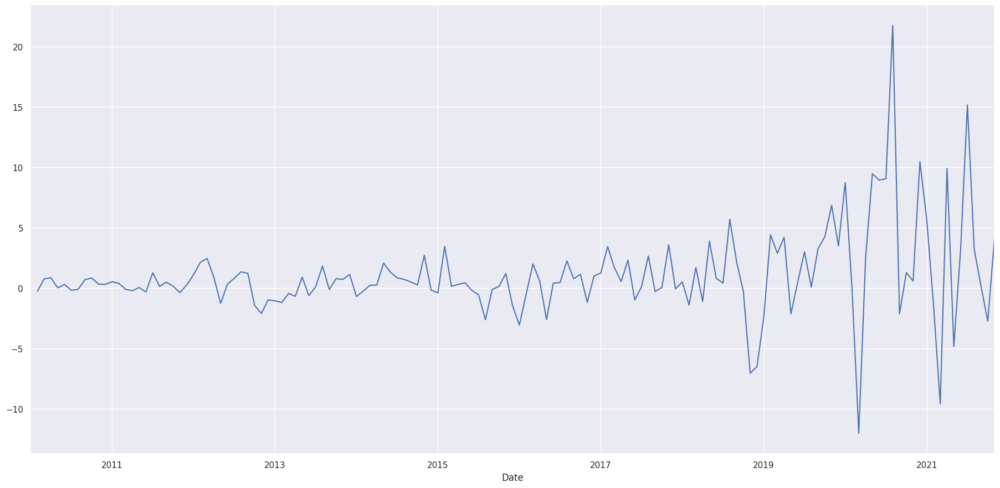

In [97]:
monthly_data.set_index('Date')['differenced_trasnformation_demand'].plot(figsize=FIGURE_SIZE)

In [100]:
import pandas as pd
import numpy as np

def build_temporal_features(data: pd.DataFrame) -> pd.DataFrame:
    # Ensure 'Date' is in datetime format
    data['Date'] = pd.to_datetime(data['Date'])

    # Add temporal features
    data['week'] = data['Date'].dt.isocalendar().week  # Correct usage for week number
    data['day'] = data['Date'].dt.day
    data['dayofweek'] = data['Date'].dt.dayofweek
    data['is_weekend'] = (data['dayofweek'] > 5).astype(np.int8)  # Mark weekends (Saturday=6, Sunday=7)

    return data

# Call the function on monthly_data
df1 = build_temporal_features(monthly_data)

# Display the first few rows of the dataframe
df1.head()


,Date,Adj Close,Year,Month,dayofweek,quarter,monthly_diff,square_root_transformation_demand,square_root_inv_transformation_demand,cube_root_transformation_demand,cube_root_inv_transformation_demand,log_transformation_demand,log_inv_transformation_demand,differenced_trasnformation_demand,differenced_demand_filled,differenced_inv_transformation_demand,week,day,is_weekend
0,2010-01-31,6.369562,2010,January,6,1,NaN,2.523799,6.369562,1.853688,6.369562,1.997358,6.369562,NaN,6.369562,6.369562,4,31,1
1,2010-02-28,6.096047,2010,February,6,1,-0.273515,2.469017,6.096047,1.826765,6.096047,1.959538,6.096047,-0.273515,-0.273515,6.096047,8,28,1
2,2010-03-31,6.850866,2010,March,2,1,0.754818,2.617416,6.850866,1.899249,6.850866,2.060624,6.850866,0.754818,0.754818,6.850866,13,31,0
3,2010-04-30,7.701438,2010,April,4,2,0.850573,2.775147,7.701438,1.974804,7.701438,2.163488,7.701438,0.850573,0.850573,7.701438,17,30,0
4,2010-05-31,7.711035,2010,May,0,2,0.009596,2.776875,7.711035,1.975624,7.711035,2.164591,7.711035,0.009596,0.009596,7.711035,22,31,0


# select & split data to prepare for deep learning

In [101]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import sklearn.metrics as metrics
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [102]:
FIGURE_SIZE = (20, 10)
plt.rcParams['axes.grid'] = True

%matplotlib inline

In [103]:
import tensorflow as tf

 Set seed to get same results when re-run code of model

In [104]:
tf.random.set_seed(1234)

In [106]:
df11 = pd.read_csv("/content/drive/MyDrive/Date/stock.csv")
df11.head()


,Date,Adj Close,differenced_trasnformation_demand,differenced_demand_filled,differenced_inv_transformation_demand,date,year,month,week,day,dayofweek,week_of_month,is_weekend
0,2010-01-04,6.562589,NaN,6.562589,6.562589,2010-01-04,2010,1,1,4,0,1,0
1,2010-01-05,6.573936,0.011347,0.011347,6.573936,2010-01-05,2010,1,1,5,1,1,0
2,2010-01-06,6.469368,-0.104568,-0.104568,6.469368,2010-01-06,2010,1,1,6,2,1,0
3,2010-01-07,6.457407,-0.011961,-0.011961,6.457407,2010-01-07,2010,1,1,7,3,1,0
4,2010-01-08,6.500340,0.042933,0.042933,6.500340,2010-01-08,2010,1,1,8,4,2,0


In [107]:
df11

,Date,Adj Close,differenced_trasnformation_demand,differenced_demand_filled,differenced_inv_transformation_demand,date,year,month,week,day,dayofweek,week_of_month,is_weekend
0,2010-01-04,6.562589,NaN,6.562589,6.562589,2010-01-04,2010,1,1,4,0,1,0
1,2010-01-05,6.573936,0.011347,0.011347,6.573936,2010-01-05,2010,1,1,5,1,1,0
2,2010-01-06,6.469368,-0.104568,-0.104568,6.469368,2010-01-06,2010,1,1,6,2,1,0
3,2010-01-07,6.457407,-0.011961,-0.011961,6.457407,2010-01-07,2010,1,1,7,3,1,0
4,2010-01-08,6.500340,0.042933,0.042933,6.500340,2010-01-08,2010,1,1,8,4,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2975,2021-10-27,148.850006,-0.470001,-0.470001,148.850006,2021-10-27,2021,10,43,27,2,4,0
2976,2021-10-28,152.570007,3.720001,3.720001,152.570007,2021-10-28,2021,10,43,28,3,4,0
2977,2021-10-29,149.800003,-2.770004,-2.770004,149.800003,2021-10-29,2021,10,43,29,4,5,0
2978,2021-11-01,148.960007,-0.839996,-0.839996,148.960007,2021-11-01,2021,11,44,1,0,1,0


<Axes: xlabel='Date'>

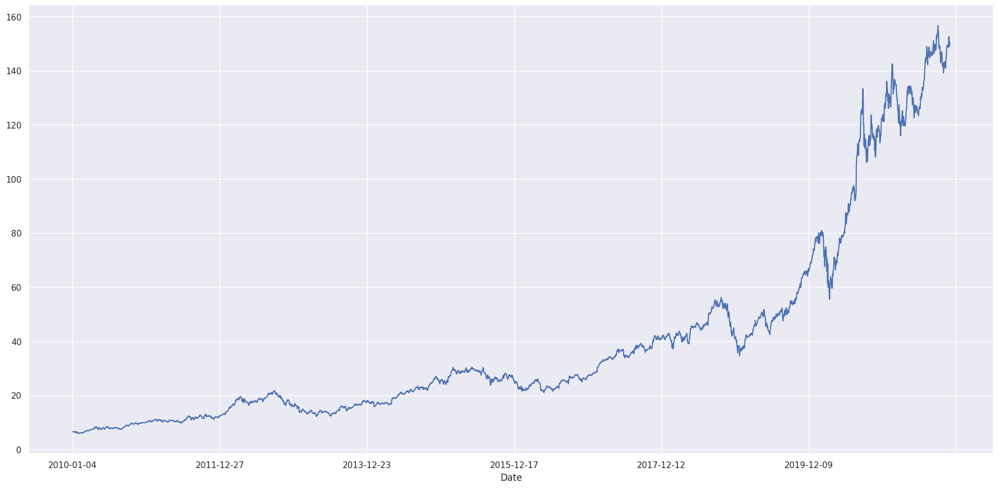

In [108]:
df11.set_index('Date')['Adj Close'].plot(figsize=FIGURE_SIZE)

In [109]:

mask = (df11['Date'] > '2010-01-01') & (df11['Date'] <= '2019-12-31')
print(df11.loc[mask])

            Date  Adj Close  differenced_trasnformation_demand  \
0     2010-01-04   6.562589                                NaN   
1     2010-01-05   6.573936                           0.011347   
2     2010-01-06   6.469368                          -0.104568   
3     2010-01-07   6.457407                          -0.011961   
4     2010-01-08   6.500340                           0.042933   
...          ...        ...                                ...   
2511  2019-12-24  70.129509                           0.066605   
2512  2019-12-26  71.520905                           1.391396   
2513  2019-12-27  71.493767                          -0.027138   
2514  2019-12-30  71.918076                           0.424309   
2515  2019-12-31  72.443565                           0.525489   

      differenced_demand_filled  differenced_inv_transformation_demand  \
0                      6.562589                               6.562589   
1                      0.011347                            

In [110]:
df12=df11.loc[mask]

select your feature

In [111]:
#X=  df11[['Date']]
y= df11['Adj Close']

# Scale and transform

In [112]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,1))
y=scaler.fit_transform(np.array(y).reshape(-1,1))

In [113]:
##splitting dataset into train and test split
training_size=int(len(y)*0.65)
test_size=len(y)-training_size
train_data,test_data=y[0:training_size,:],y[training_size:len(y),:1]

In [114]:
training_size,test_size

(1937, 1043)

In [115]:
train_data[2]

array([0.00384731])

In [116]:
def create_dataset(dataset, time_step=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-time_step-1):
		a = dataset[i:(i+time_step), 0]  #0-100
		dataX.append(a)
		dataY.append(dataset[i + time_step, 0])
	return numpy.array(dataX), numpy.array(dataY)

In [117]:
import numpy

In [118]:
time_step = 100
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)

In [119]:
print(X_train.shape), print(y_train.shape)

(1836, 100)
(1836,)


(None, None)

In [120]:
print(X_test.shape), print(ytest.shape)

(942, 100)
(942,)


(None, None)

In [121]:
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

In [122]:
### Create the Stacked LSTM model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout ,BatchNormalization
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.initializers import RandomNormal, Constant


# LSTM Model

In [123]:


# model=Sequential()
# model.add(LSTM(150,return_sequences=True,input_shape=(100,1)))
# model.add(Dropout(0.2))
# model.add(LSTM(150,return_sequences=True))
# model.add(LSTM(150, return_sequences=True))
# model.add(Dropout(0.2))
# model.add(LSTM(100))
# model.add(Dropout(0.2))
# model.add(Dense(1))
# model.compile(loss='mean_squared_error',optimizer='adam')


model=Sequential()
# Adding first LSTM layer
model.add(LSTM(units=100, return_sequences=True, input_shape=(100,1)))
model.add(Dropout(0.2))
# second LSTM layer
model.add(LSTM(units=100, return_sequences=True))
model.add(Dropout(0.2))
# Adding third LSTM layer
model.add(LSTM(units=100, return_sequences=True))
model.add(Dropout(0.2))
# Adding fourth LSTM layer
model.add(LSTM(units=100, return_sequences=True))
model.add(Dropout(0.2))
# Adding fifth LSTM layer a
model.add(LSTM(units=100))
model.add(Dropout(0.2))
# Adding the Output Layer
model.add(Dense(units=1))

model.compile(optimizer = 'adam', loss = 'mean_squared_error')





In [124]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_5 (LSTM)                        │ (None, 100, 100)            │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 100, 100)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_6 (LSTM)                        │ (None, 100, 100)            │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 100, 100)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 100, 100)            │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 100, 100)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_8 (LSTM)                        │ (None, 100, 100)            │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 100, 100)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_9 (LSTM)                        │ (None, 100)                 │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             101 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 362,501 (1.38 MB)

 Trainable params: 362,501 (1.38 MB)

 Non-trainable params: 0 (0.00 B)

In [125]:
#history= model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=54,batch_size=84,verbose=1)

In [126]:
from tensorflow.keras.callbacks import EarlyStopping

In [127]:
monitor = EarlyStopping(monitor='val_loss', min_delta=1e-3, patience=10,
        verbose=1, mode='auto', restore_best_weights=True)

history=model.fit(X_train,y_train,validation_data=(X_test,ytest),
        callbacks=[monitor],verbose=1,epochs=1000)

Epoch 1/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 53s 745ms/step - loss: 0.0018 - val_loss: 0.0090
Epoch 2/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 73s 595ms/step - loss: 1.3980e-04 - val_loss: 0.0034
Epoch 3/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 43s 633ms/step - loss: 1.4178e-04 - val_loss: 0.0032
Epoch 4/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 32s 553ms/step - loss: 1.1925e-04 - val_loss: 0.0028
Epoch 5/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 35s 604ms/step - loss: 1.0586e-04 - val_loss: 0.0060
Epoch 6/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 43s 635ms/step - loss: 1.2684e-04 - val_loss: 0.0054
Epoch 7/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 37s 568ms/step - loss: 1.4362e-04 - val_loss: 0.0038
Epoch 8/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 41s 575ms/step - loss: 9.2591e-05 - val_loss: 0.0011
Epoch 9/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 32s 548ms/step - loss: 7.8887e-05 - val_loss: 0.0028
Epoch 10/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 32s 552ms/step - loss: 6.9704e-05 - val_loss: 0.0014
Epoch 11/1000
58/58 ━━━━━━━━━━━━━━━━━━━━ 32s 547ms/step - loss: 7.3583e-0

In [128]:
import tensorflow as tf

In [129]:
tf.__version__

'2.17.0'

Save model if you want and load

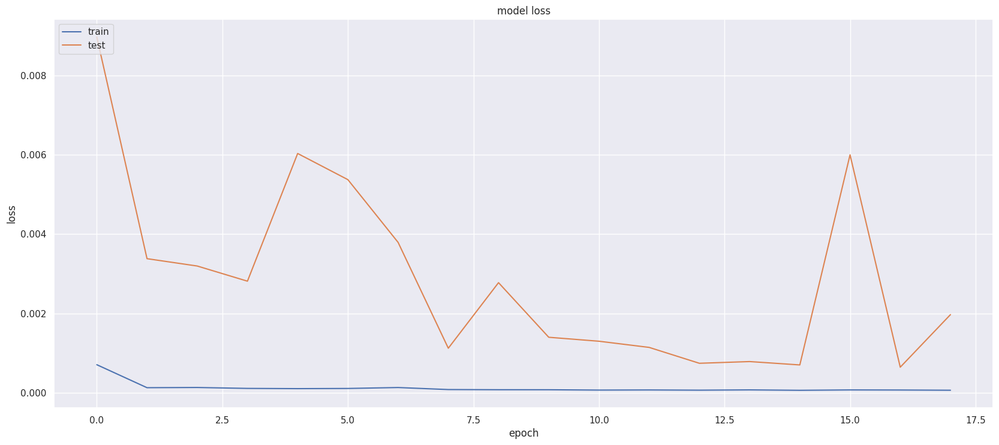

In [130]:
plt.plot(history.history['loss']) #r
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [132]:
model.save_weights('mylstm.weights.h5')

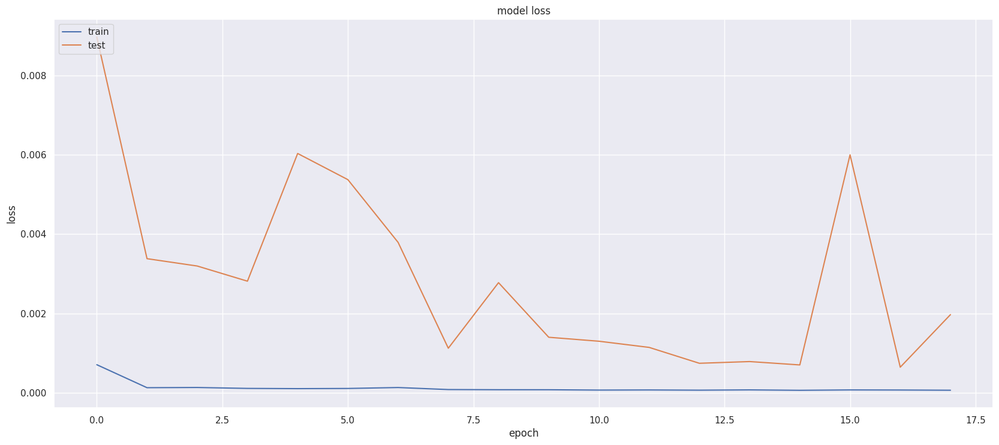

In [133]:
plt.plot(history.history['loss']) # vn
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()


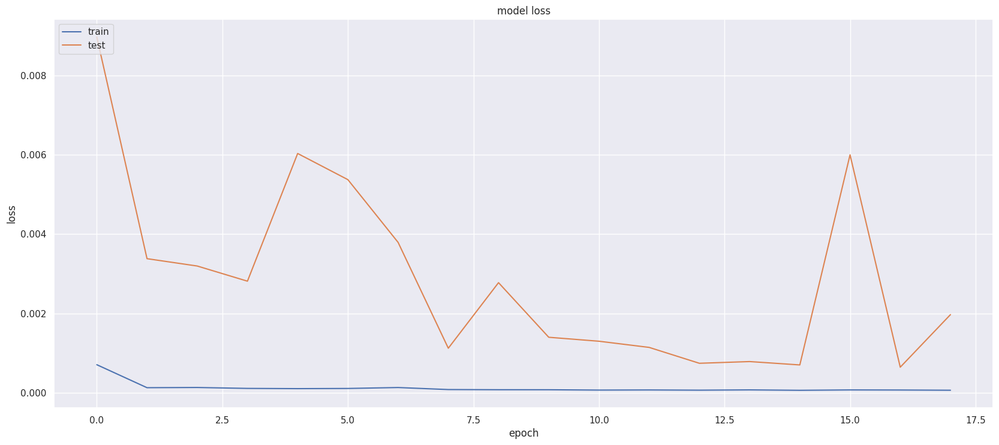

In [134]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

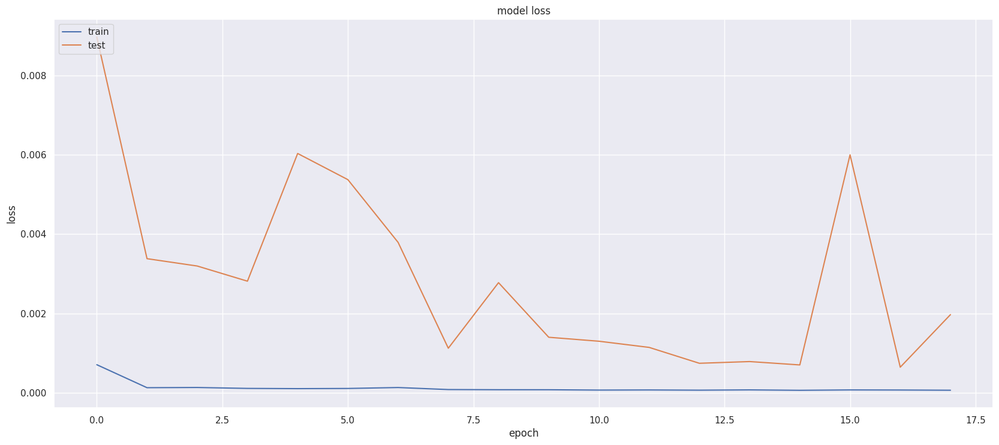

In [135]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

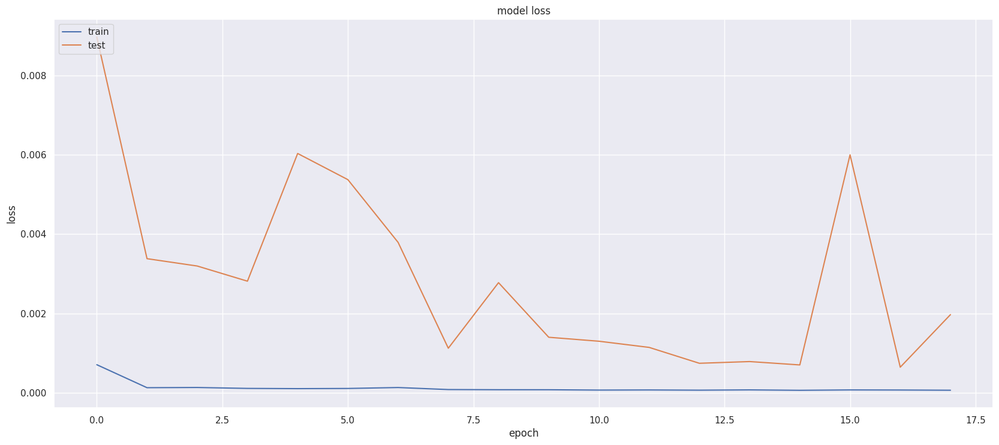

In [136]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

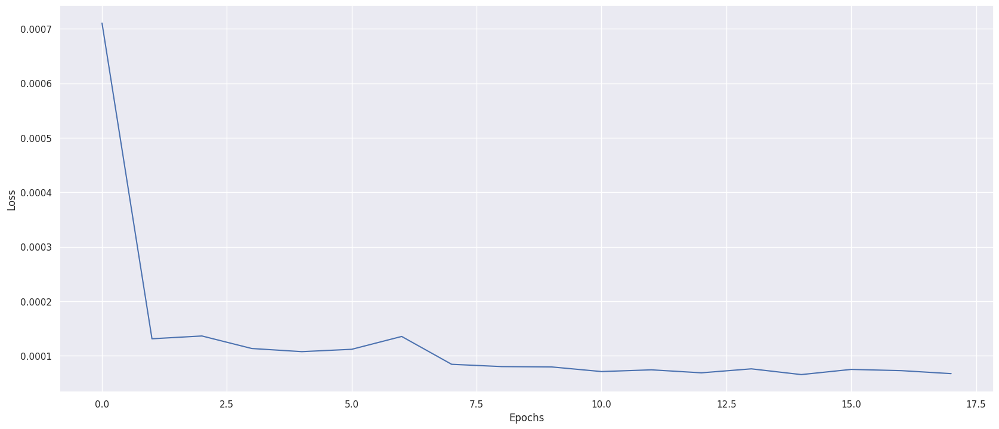

In [137]:
plt.plot(history.history['loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

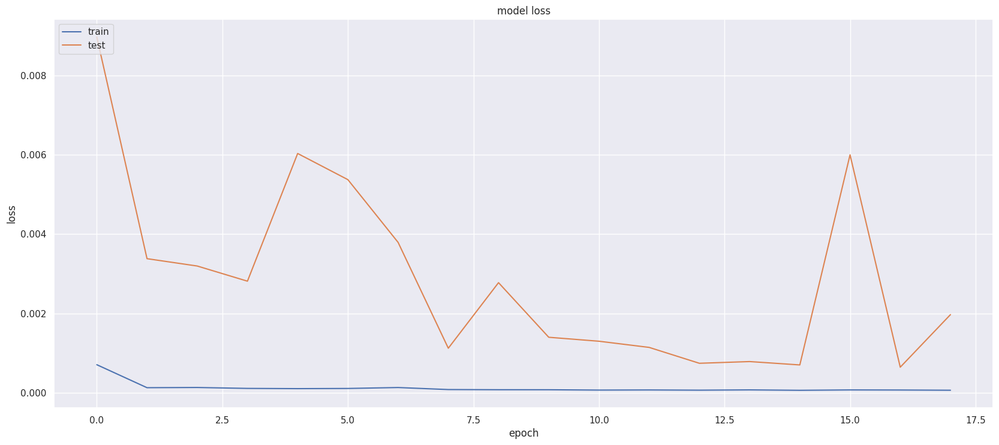

In [138]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [139]:
### Lets Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)

58/58 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step
30/30 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step


In [140]:
##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

In [141]:
### Calculate RMSE performance metrics
import math
from sklearn.metrics import mean_squared_error
math.sqrt(mean_squared_error(y_train,train_predict))

21.71023644030157

In [142]:
### Test Data RMSE
math.sqrt(mean_squared_error(ytest,test_predict))

86.46429651349146

In [143]:
### Calculate RMSE performance metrics
import math
from sklearn.metrics import mean_squared_error
math.sqrt(mean_squared_error(y_train,train_predict))

21.71023644030157

In [144]:
### Test Data RMSE
math.sqrt(mean_squared_error(ytest,test_predict))

86.46429651349146

In [145]:
### Calculate RMSE performance metrics
import math
from sklearn.metrics import mean_squared_error
math.sqrt(mean_squared_error(y_train,train_predict))

21.71023644030157

In [146]:
### Test Data RMSE
math.sqrt(mean_squared_error(ytest,test_predict))

86.46429651349146

In [147]:
### Calculate RMSE performance metrics
import math
from sklearn.metrics import mean_squared_error
math.sqrt(mean_squared_error(y_train,train_predict))

21.71023644030157

In [148]:
### Test Data RMSE
math.sqrt(mean_squared_error(ytest,test_predict))

86.46429651349146

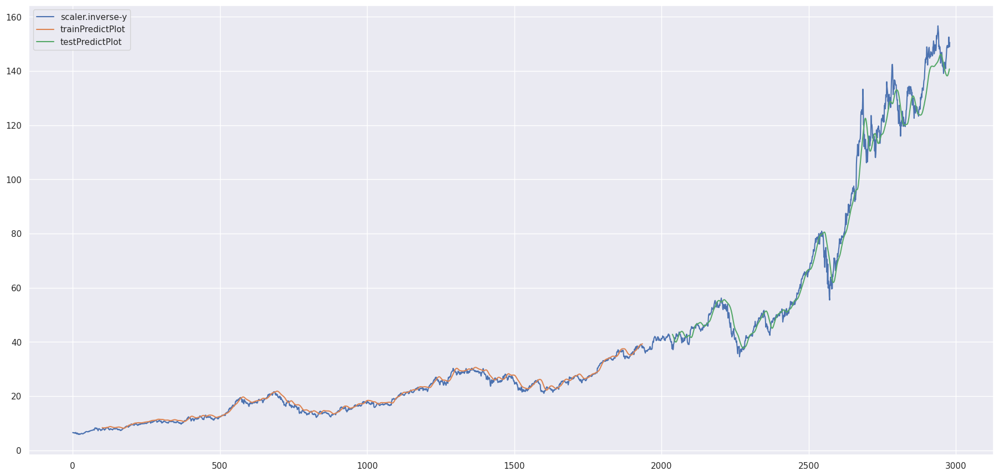

In [149]:
### Plotting
# shift train predictions for plotting
look_back=100
fig, ax = plt.subplots(figsize=(20,10))
trainPredictPlot = numpy.empty_like(y)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(y)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(y)-1, :] = test_predict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(y))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.legend(['scaler.inverse-y','trainPredictPlot','testPredictPlot'])
plt.show()

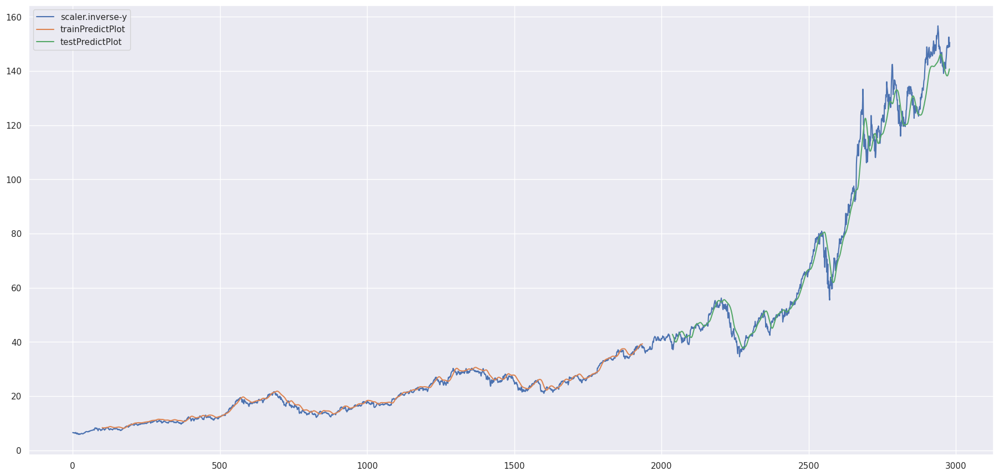

In [150]:
# shift train predictions for plotting
look_back=100
fig, ax = plt.subplots(figsize=(20,10))
trainPredictPlot = numpy.empty_like(y)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(y)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(y)-1, :] = test_predict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(y))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.legend(['scaler.inverse-y','trainPredictPlot','testPredictPlot'])
plt.show()

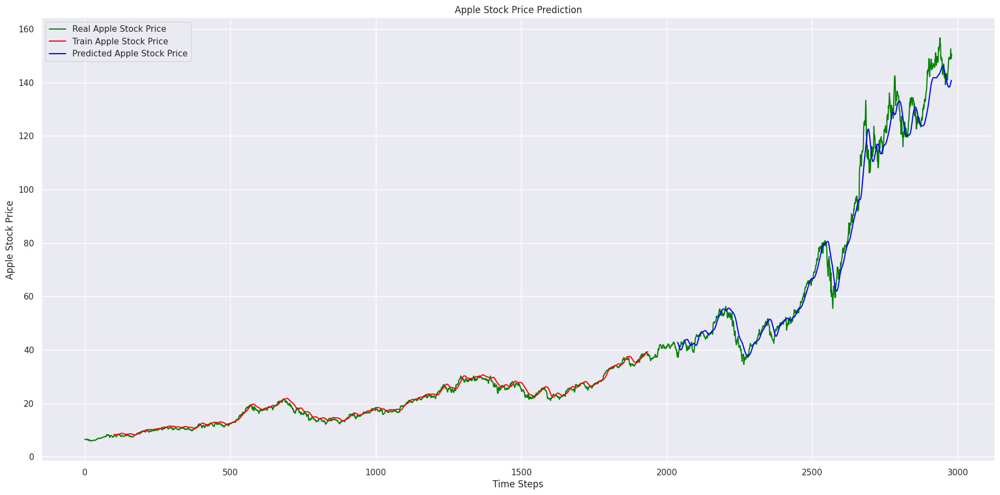

In [151]:
fig, ax = plt.subplots(figsize=(20,10))
plt.plot(scaler.inverse_transform(y), color='Green', label='Real Apple Stock Price')
plt.plot(trainPredictPlot, color='Red', label='Train Apple Stock Price')
plt.plot(testPredictPlot, color='Blue', label='Predicted Apple Stock Price')

plt.title('Apple Stock Price Prediction')
plt.xlabel('Time Steps')
plt.ylabel('Apple Stock Price')
plt.legend()
plt.show()

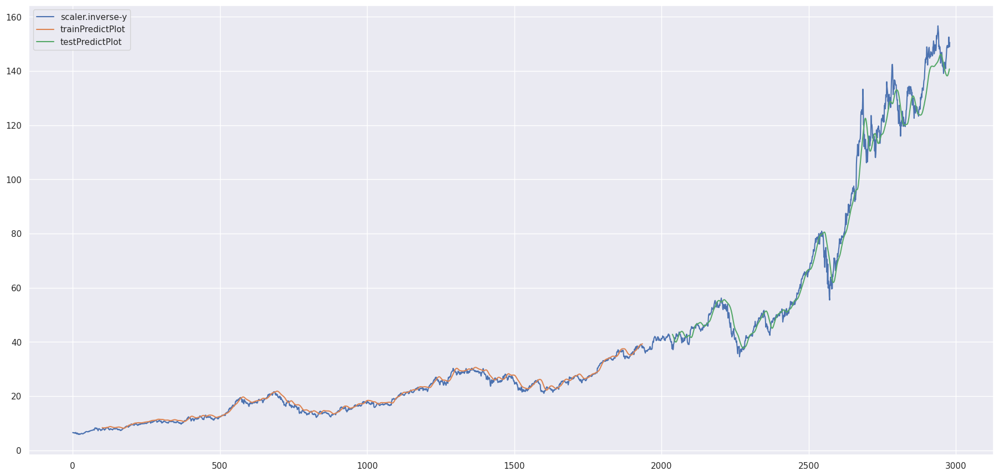

In [152]:
### Plotting
# shift train predictions for plotting
look_back=100
fig, ax = plt.subplots(figsize=(20,10))
trainPredictPlot = numpy.empty_like(y)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict
# shift test predictions for plotting
testPredictPlot = numpy.empty_like(y)
testPredictPlot[:, :] = numpy.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(y)-1, :] = test_predict
# plot baseline and predictions
plt.plot(scaler.inverse_transform(y))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.legend(['scaler.inverse-y','trainPredictPlot','testPredictPlot'])
plt.show()

In [153]:
# evaluate the model
train_mse = model.evaluate(X_train, y_train, verbose=1)
test_mse = model.evaluate(X_test, ytest, verbose=1)



58/58 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 3.3010e-05
30/30 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - loss: 5.4041e-04


In [154]:
train_mse > test_mse

False

In [155]:
print('Train: %.3f, Test: %.3f' % (train_mse, test_mse))

Train: 0.000, Test: 0.001


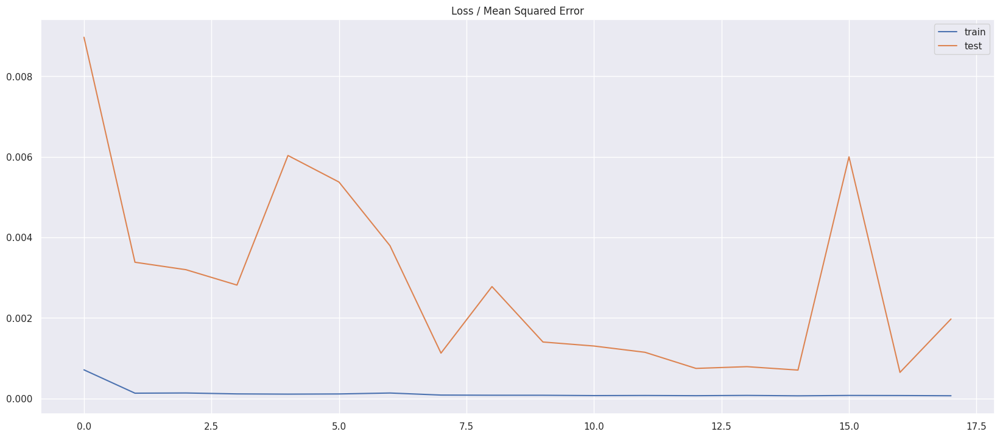

In [156]:
# plot loss during training
plt.title('Loss / Mean Squared Error')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()


In [157]:
df11['Adj Close']

,Adj Close
0,6.562589
1,6.573936
2,6.469368
3,6.457407
4,6.500340
...,...
2975,148.850006
2976,152.570007
2977,149.800003
2978,148.960007


In [158]:
df11.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2980 entries, 0 to 2979
Data columns (total 13 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   Date                                   2980 non-null   object 
 1   Adj Close                              2980 non-null   float64
 2   differenced_trasnformation_demand      2979 non-null   float64
 3   differenced_demand_filled              2980 non-null   float64
 4   differenced_inv_transformation_demand  2980 non-null   float64
 5   date                                   2980 non-null   object 
 6   year                                   2980 non-null   int64  
 7   month                                  2980 non-null   int64  
 8   week                                   2980 non-null   int64  
 9   day                                    2980 non-null   int64  
 10  dayofweek                              2980 non-null   int64  
 11  week

In [159]:
bb = df11[['Date','Adj Close']]

In [160]:
bb.tail()

,Date,Adj Close
2975,2021-10-27,148.850006
2976,2021-10-28,152.570007
2977,2021-10-29,149.800003
2978,2021-11-01,148.960007
2979,2021-11-02,150.580002


In [162]:
!pip install prophet

In [164]:
from prophet import Prophet

In [165]:
aapl_features = bb.rename(columns = {"Date":"ds","Adj Close":"y"})
aapl_features.head()

,ds,y
0,2010-01-04,6.562589
1,2010-01-05,6.573936
2,2010-01-06,6.469368
3,2010-01-07,6.457407
4,2010-01-08,6.500340


In [166]:
aapl_model = Prophet(daily_seasonality = True) # stock prices have daily seasonality
aapl_model.fit(aapl_features)

DEBUG:cmdstanpy:input tempfile: /tmp/tmpxb5emcj1/ry4pkl35.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpxb5emcj1/5t82lzno.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85276', 'data', 'file=/tmp/tmpxb5emcj1/ry4pkl35.json', 'init=/tmp/tmpxb5emcj1/5t82lzno.json', 'output', 'file=/tmp/tmpxb5emcj1/prophet_modelddehlrhn/prophet_model-20241108215006.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:50:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:50:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [167]:
future = aapl_model.make_future_dataframe(periods = 58) # how many days into the future we want
prediction = aapl_model.predict(future)

In [168]:
prediction

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2010-01-04,6.534083,1.205092,12.194027,6.534083,6.534083,0.314461,0.314461,0.314461,-0.04383,...,-0.009778,-0.009778,-0.009778,0.368069,0.368069,0.368069,0.0,0.0,0.0,6.848544
1,2010-01-05,6.542992,1.296984,12.422031,6.542992,6.542992,0.332704,0.332704,0.332704,-0.04383,...,0.036605,0.036605,0.036605,0.339929,0.339929,0.339929,0.0,0.0,0.0,6.875696
2,2010-01-06,6.551900,1.791516,11.905708,6.551900,6.551900,0.308421,0.308421,0.308421,-0.04383,...,0.038578,0.038578,0.038578,0.313672,0.313672,0.313672,0.0,0.0,0.0,6.860321
3,2010-01-07,6.560809,1.274436,12.212311,6.560809,6.560809,0.260457,0.260457,0.260457,-0.04383,...,0.014368,0.014368,0.014368,0.289919,0.289919,0.289919,0.0,0.0,0.0,6.821266
4,2010-01-08,6.569718,1.429871,11.514342,6.569718,6.569718,0.134673,0.134673,0.134673,-0.04383,...,-0.090730,-0.090730,-0.090730,0.269233,0.269233,0.269233,0.0,0.0,0.0,6.704391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3033,2021-12-26,163.371694,158.856341,169.282218,163.272618,163.461110,0.558433,0.558433,0.558433,-0.04383,...,0.005479,0.005479,0.005479,0.596784,0.596784,0.596784,0.0,0.0,0.0,163.930127
3034,2021-12-27,163.500165,158.739074,169.532693,163.392643,163.606226,0.527256,0.527256,0.527256,-0.04383,...,-0.009778,-0.009778,-0.009778,0.580864,0.580864,0.580864,0.0,0.0,0.0,164.027421
3035,2021-12-28,163.628636,158.878692,169.245138,163.512928,163.739688,0.554157,0.554157,0.554157,-0.04383,...,0.036605,0.036605,0.036605,0.561382,0.561382,0.561382,0.0,0.0,0.0,164.182793
3036,2021-12-29,163.757108,158.972947,169.562248,163.632259,163.878789,0.533489,0.533489,0.533489,-0.04383,...,0.038578,0.038578,0.038578,0.538741,0.538741,0.538741,0.0,0.0,0.0,164.290597


In [169]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.offline as py

In [170]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=prediction['ds'], y=prediction['yhat'],
                    mode='markers',
                    name='Most Likely'))
fig.add_trace(go.Scatter(x=prediction['ds'], y=prediction['yhat_lower'],
                    mode='lines+markers',
                    name='Pessimistic'))
fig.add_trace(go.Scatter(x=prediction['ds'], y=prediction['yhat_upper'],
                    mode='lines',
                    name='Optimistic'))

fig.add_trace(go.Scatter(x=aapl_features['ds'], y=aapl_features['y'], name='Actual',
                         line = dict(color='goldenrod')))
fig.show()

<Axes: xlabel='Date'>

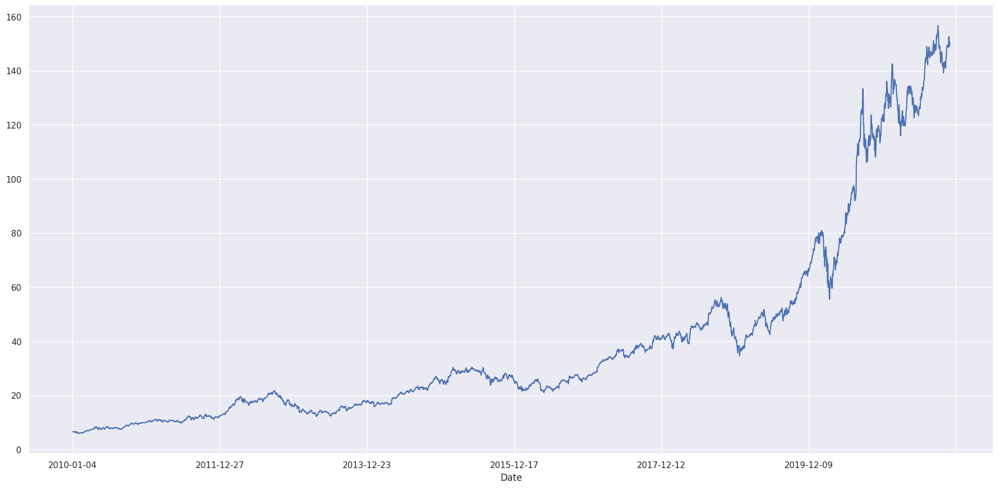

In [171]:
df11.set_index('Date')['Adj Close'].plot(figsize=FIGURE_SIZE)

# Neuralprophet

In [172]:
!pip install neuralprophet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.8/145.8 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 32.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 891.4/891.4 kB 41.5 MB/s eta 0:00:00


In [173]:
pip install neuralprophet[live]

In [177]:
!pip install plotly

In [178]:
import pandas as pd
from neuralprophet import NeuralProphet

In [179]:
df11 = pd.read_csv("/content/drive/MyDrive/Date/stock.csv")
df11.head()

,Date,Adj Close,differenced_trasnformation_demand,differenced_demand_filled,differenced_inv_transformation_demand,date,year,month,week,day,dayofweek,week_of_month,is_weekend
0,2010-01-04,6.562589,NaN,6.562589,6.562589,2010-01-04,2010,1,1,4,0,1,0
1,2010-01-05,6.573936,0.011347,0.011347,6.573936,2010-01-05,2010,1,1,5,1,1,0
2,2010-01-06,6.469368,-0.104568,-0.104568,6.469368,2010-01-06,2010,1,1,6,2,1,0
3,2010-01-07,6.457407,-0.011961,-0.011961,6.457407,2010-01-07,2010,1,1,7,3,1,0
4,2010-01-08,6.500340,0.042933,0.042933,6.500340,2010-01-08,2010,1,1,8,4,2,0


In [180]:
cc = df11[['Date','Adj Close']]
aapl_feature = cc.rename(columns = {"Date":"ds","Adj Close":"y"})
aapl_feature.head()

,ds,y
0,2010-01-04,6.562589
1,2010-01-05,6.573936
2,2010-01-06,6.469368
3,2010-01-07,6.457407
4,2010-01-08,6.500340


In [181]:
#model = NeuralProphet(daily_seasonality=False)
model = NeuralProphet()

In [182]:
metrics = model.fit(aapl_feature,
                    freq='D', epochs=1000)

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.409% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.409% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 64
INFO:NP.config:Auto-set batch_size to 

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (47) is too small than the required number                     for the learning rate finder (237). The results might not be optimal.


Finding best initial lr:   0%|          | 0/237 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

In [183]:
forecast = model.predict(aapl_feature)

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.409% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.409% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.409% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.409% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


In [184]:
fig_forecast = model.plot(forecast)
fig_components = model.plot_components(forecast)
#fig_model = model.plot_parameters()


WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 
WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


In [186]:
!pip install plotly-resampler

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 12.8 MB/s eta 0:00:00


In [187]:
import warnings
warnings.filterwarnings("ignore", message=".*plotly-resampler.*")

Text(0.5, 0, 'epoch')

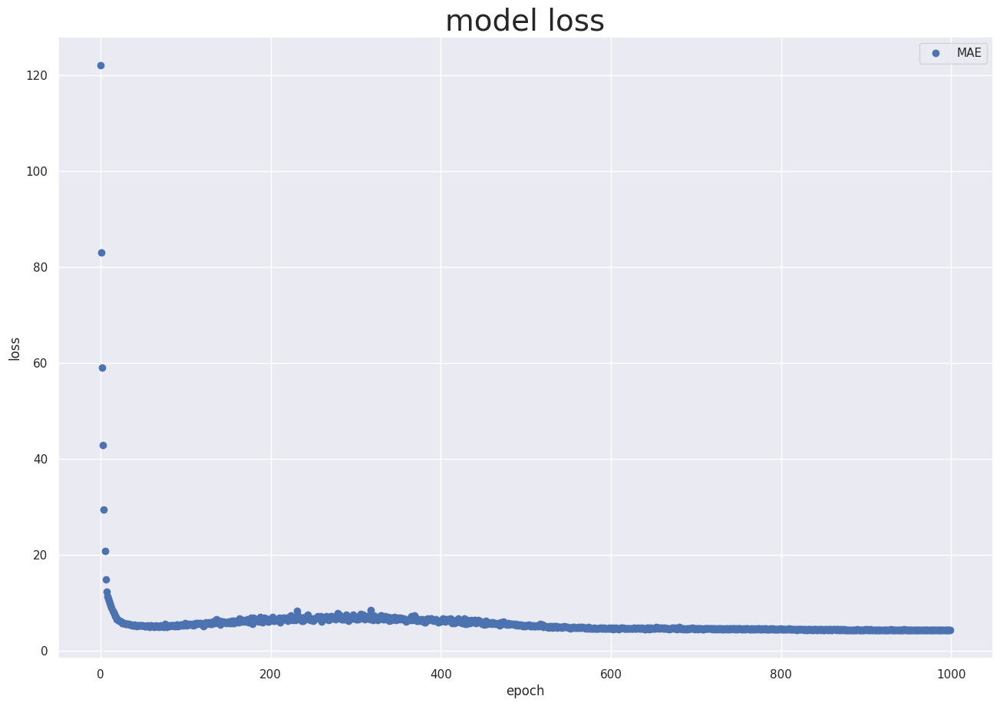

In [192]:
fig, ax = plt.subplots(figsize=(14, 10))
ax.plot(metrics["MAE"], 'ob', linewidth=6, label="Training Loss")
#ax.plot(metrics["SmoothL1Loss"], '-r', linewidth=2, label="Validation Loss")
ax.legend(['MAE'])
ax.set_title("model loss", fontsize=28)
plt.ylabel('loss')
plt.xlabel('epoch')

In [193]:
m = NeuralProphet()
df_train, df_test = m.split_df(aapl_feature, valid_p=0.3,freq='D')

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.409% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.409% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


In [194]:
# train_metrics = m.fit(df_train,freq='D',epochs=1000)
# test_metrics = m.test(df_test)

In [196]:
from neuralprophet import NeuralProphet

# Assuming df_train and df_test are already defined
m = NeuralProphet()

# Fit the model without the plot_live_loss argument
metricss = m.fit(df_train, validation_df=df_test, freq='D', epochs=1000)

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.357% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.357% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO:NP.utils:Disabling daily seasonality. Run NeuralProphet with daily_seasonality=True to override this.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (NP.config.set_lr_finder_args) - Learning rate finder: The number of batches (66) is too small than the required number                     for the learning rate finder (233). The results might not be optimal.


Finding best initial lr:   0%|          | 0/233 [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [197]:
forecast = m.predict(df_train)

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.357% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.357% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.357% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.357% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column


In [199]:
fig_forecast = m.plot(forecast)
ax.set_title("Apple stock price prediction", fontsize=28)
#ax.legend(['Predicted', 'Actual'])
#fig_components = model.plot_components(forecast)
#fig_model = model.plot_parameters()

WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 


Text(0.5, 1.0, 'Apple stock price prediction')

Text(0.5, 0, 'epoch')

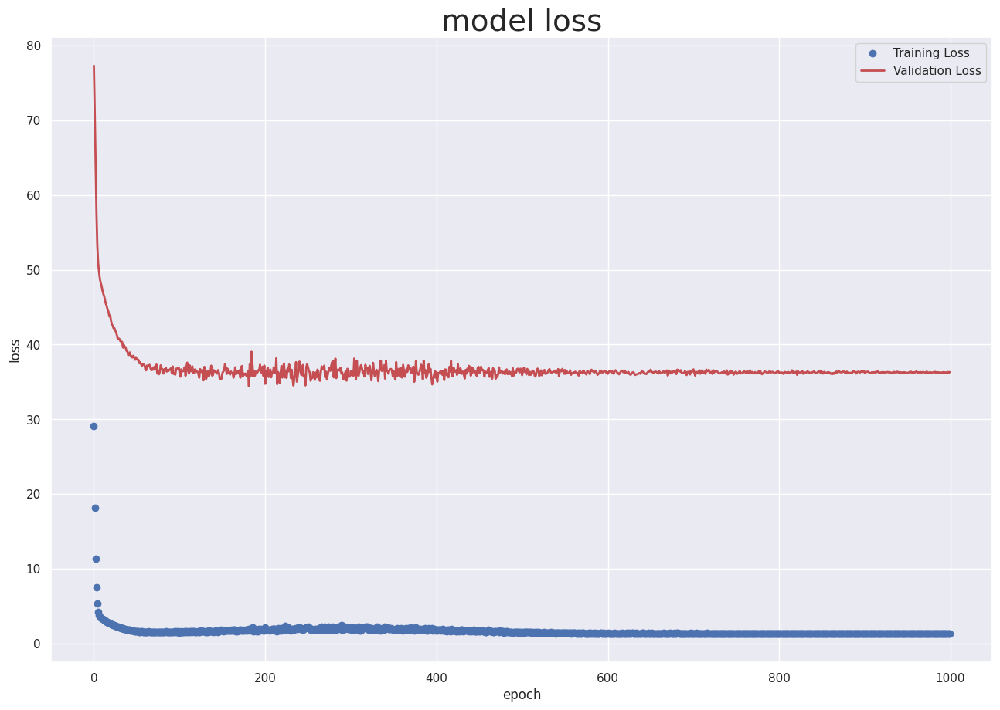

In [201]:
fig, ax = plt.subplots(figsize=(14, 10))
ax.plot(metricss["RMSE"], 'ob', linewidth=6, label="Training Loss")
ax.plot(metricss["RMSE_val"], '-r', linewidth=2, label="Validation Loss")
ax.legend(['RMSE', 'RMSE_val'])
ax.set_title("model loss", fontsize=28)
ax.legend(['Training Loss', 'Validation Loss'])
plt.ylabel('loss')
plt.xlabel('epoch')

In [204]:
# from neuralprophet import set_random_seed
# set_random_seed(0)

In [202]:
import matplotlib.pyplot as plt
%matplotlib inline

In [203]:
f_future = m.make_future_dataframe(df_train, periods=60)
forecast = m.predict(f_future)
fig_forecast = m.plot(forecast)

INFO - (NP.df_utils._infer_frequency) - Major frequency B corresponds to 96.357% of the data.
INFO:NP.df_utils:Major frequency B corresponds to 96.357% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 98.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 98.333% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO:NP.df_utils:Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 98.333% of the data.
INFO:NP.df_utils:Major frequency D corresponds to 98.333% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
INFO:NP.df_utils:Returning df with no ID column
WARNING - (NP.plotting.log_warning_resampler_switch_to_valid_env) - Warning: plotly-resampler not supported for the environment you are using. Plotting backend automatically switched to 'plotly' without resampling 
